# Chapter 17 - Representation Learning and Generative Learning Using Autoencoders and GANs

Ensure GPU Env is working correctly

In [1]:
import tensorflow as tf
import os
from tensorflow import keras

In [2]:
tf.__version__

'2.8.0'

In [3]:
keras.__version__

'2.8.0'

In [4]:
print("Num of GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num of GPUs Available:  1


## Additional Libraries 

In [2]:
import numpy as np
import pandas as pd
import os 
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from pathlib import Path

## PCA with a linear Autoencoder

If we are to create an autoencoder, and it only uses linear activations and the cost function is the mean squared error (MSE), then we simply get PCA:

In [6]:
# create function to simulate random 3D dataset
def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

In [7]:
# Build the autoencoder

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])

autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1.5))

In [8]:
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
2/2 [==============================] - 4s 53ms/step - loss: 0.6508
Epoch 2/20
2/2 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 3/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0569
Epoch 4/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0524
Epoch 5/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0467
Epoch 6/20
2/2 [==============================] - 0s 9ms/step - loss: 0.0368
Epoch 7/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0292
Epoch 8/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0216
Epoch 9/20
2/2 [==============================] - 0s 5ms/step - loss: 0.0141
Epoch 10/20
2/2 [==============================] - 0s 4ms/step - loss: 0.0095
Epoch 11/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0077
Epoch 12/20
2/2 [==============================] - 0s 3ms/step - loss: 0.0071
Epoch 13/20
2/2 [==============================] - 0s 3ms/step - loss: 0

In [9]:
codings = encoder.predict(X_train)

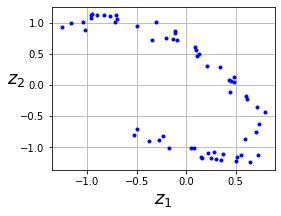

In [10]:
ig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.show()

The above shows our 3D dataset compiled as a 2D projection with a maximum variance using our autoencoder. Very cool!

## Stacked Autoencoders

In [11]:
# Using the MNIST dataset
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_val = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_val = y_train_full[:-5000], y_train_full[-5000:]

## Train all layers at once

Now we can build a stacked Autoencoder with 3 hidden layers and 1 output layer (i.e., 2 stacked Autoencoders)

In [12]:
def rounded_accuracy(y_true, y_pred):
    return keras.metrics.binary_accuracy(tf.round(y_true), tf.round(y_pred))

In [13]:
stacked_encoder = keras.models.Sequential([keras.layers.Flatten(input_shape=[28,28]),
                                          keras.layers.Dense(100, activation="selu"),
                                          keras.layers.Dense(30, activation="selu"),
                                          ])
stacked_decoder = keras.models.Sequential([keras.layers.Dense(100, activation="selu", input_shape=[30]),
                                         keras.layers.Dense(28 * 28, activation="sigmoid"),
                                         keras.layers.Reshape([28, 28])
                                         ])
stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy",
                   optimizer=keras.optimizers.SGD(learning_rate=1.0), metrics=[rounded_accuracy])
history = stacked_ae.fit(X_train, X_train, epochs=20,
                         validation_data=(X_val, X_val))

Epoch 1/20
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3460 - rounded_accuracy: 0.8807 - val_loss: 0.3152 - val_rounded_accuracy: 0.9096
Epoch 2/20
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3081 - rounded_accuracy: 0.9135 - val_loss: 0.3060 - val_rounded_accuracy: 0.9162
Epoch 3/20
1719/1719 [==============================] - 9s 6ms/step - loss: 0.3014 - rounded_accuracy: 0.9194 - val_loss: 0.3006 - val_rounded_accuracy: 0.9220
Epoch 4/20
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2970 - rounded_accuracy: 0.9233 - val_loss: 0.2970 - val_rounded_accuracy: 0.9248
Epoch 5/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2939 - rounded_accuracy: 0.9262 - val_loss: 0.2953 - val_rounded_accuracy: 0.9239
Epoch 6/20
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2914 - rounded_accuracy: 0.9284 - val_loss: 0.2922 - val_rounded_accuracy: 0.9279
Epoch 7/20
1719/1719 [===============

In [14]:
# function to help plot images
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

In [15]:
# Now to create a function that can show us some reconstructions in matplotlib
def show_reconstructions(model, images=X_val, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

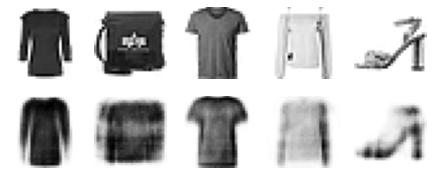

In [16]:
show_reconstructions(stacked_ae)

## Visualizing Fashion MNIST

In [17]:
# Now to work some magic using the TSNE from sklearn
from sklearn.manifold import TSNE

X_val_compressed = stacked_encoder.predict(X_val)
tsne = TSNE()
X_val_2D = tsne.fit_transform(X_val_compressed)
X_val_2D = (X_val_2D - X_val_2D.min()) / (X_val_2D.max() - X_val_2D.min())

D:\Anaconda\envs\tf-gpu\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
D:\Anaconda\envs\tf-gpu\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


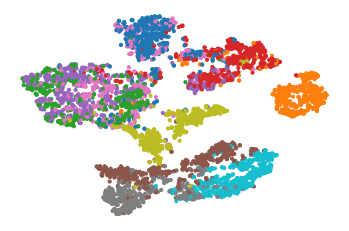

In [18]:
plt.scatter(X_val_2D[:, 0], X_val_2D[:, 1], c=y_val, s=10, cmap="tab10")
plt.axis("off")
plt.show()

Now to give a better visualization: 

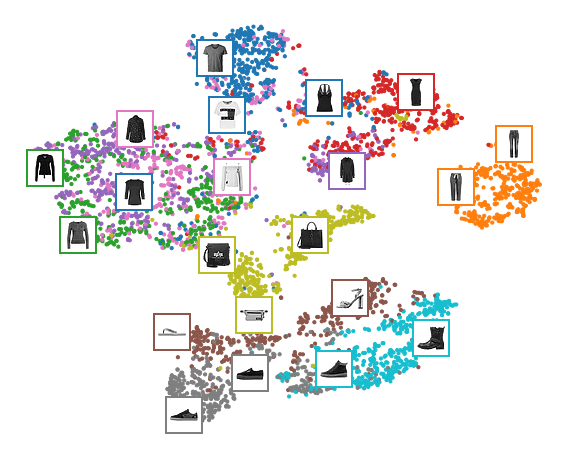

In [19]:
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_val_2D[:, 0], X_val_2D[:, 1], c=y_val, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_val_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_val[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_val[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

## Tying weights

Now we will tie the weights of the encoder and the decoder but transposing the encoder's weights as thr decoder's weights.

In [20]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)
    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias", shape=[self.dense.input_shape[-1]],
                                     initializer="zeros")
        super().build(batch_input_shape)
    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

In [21]:
dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")

tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2
])

tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])

tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])

tied_ae.compile(loss="binary_crossentropy",
                optimizer=keras.optimizers.SGD(learning_rate=1.5), metrics=[rounded_accuracy])
history = tied_ae.fit(X_train, X_train, epochs=10,
                      validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3264 - rounded_accuracy: 0.8965 - val_loss: 0.3060 - val_rounded_accuracy: 0.9094
Epoch 2/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2971 - rounded_accuracy: 0.9228 - val_loss: 0.2956 - val_rounded_accuracy: 0.9269
Epoch 3/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2913 - rounded_accuracy: 0.9284 - val_loss: 0.2896 - val_rounded_accuracy: 0.9313
Epoch 4/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2881 - rounded_accuracy: 0.9314 - val_loss: 0.2871 - val_rounded_accuracy: 0.9341
Epoch 5/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2861 - rounded_accuracy: 0.9331 - val_loss: 0.2871 - val_rounded_accuracy: 0.9346
Epoch 6/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2847 - rounded_accuracy: 0.9344 - val_loss: 0.2883 - val_rounded_accuracy: 0.9347
Epoch 7/10
1719/1719 [============

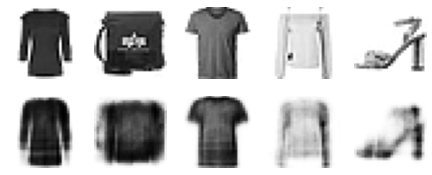

In [22]:
show_reconstructions(tied_ae)
plt.show()

## Training one Autoencoder at a time

In [23]:
def train_autoencoder(n_neurons, X_train, X_val, loss, optimizer, n_epochs=10,
                     output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs,
                    validation_data=(X_val, X_val))
    return encoder, decoder, encoder(X_train), encoder(X_val)

In [24]:
K = keras.backend
X_train_flat = K.batch_flatten(X_train) # equivalent to .reshape(-1, 28 * 28)
X_val_flat = K.batch_flatten(X_val)
enc1, dec1, X_train_enc1, X_val_enc1 = train_autoencoder(
    100, X_train_flat, X_val_flat, "binary_crossentropy",
    keras.optimizers.SGD(learning_rate=1.5), output_activation="sigmoid",
    metrics=[rounded_accuracy])
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_val_enc1, "mse", keras.optimizers.SGD(learning_rate=0.05),
    output_activation="selu")

Epoch 1/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3441 - rounded_accuracy: 0.8877 - val_loss: 0.3115 - val_rounded_accuracy: 0.9158
Epoch 2/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3033 - rounded_accuracy: 0.9209 - val_loss: 0.3002 - val_rounded_accuracy: 0.9248
Epoch 3/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2946 - rounded_accuracy: 0.9288 - val_loss: 0.2931 - val_rounded_accuracy: 0.9317
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2889 - rounded_accuracy: 0.9343 - val_loss: 0.2886 - val_rounded_accuracy: 0.9363
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2851 - rounded_accuracy: 0.9379 - val_loss: 0.2853 - val_rounded_accuracy: 0.9390
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2823 - rounded_accuracy: 0.9405 - val_loss: 0.2830 - val_rounded_accuracy: 0.9415
Epoch 7/10
1719/1719 [==================

In [25]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

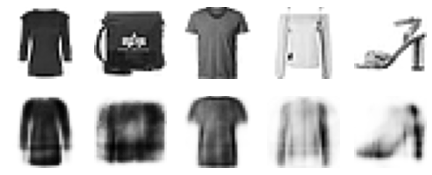

In [26]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

In [27]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy",
                          optimizer=keras.optimizers.SGD(learning_rate=0.1), metrics=[rounded_accuracy])
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=10,
                                validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2872 - rounded_accuracy: 0.9335 - val_loss: 0.2888 - val_rounded_accuracy: 0.9334
Epoch 2/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2868 - rounded_accuracy: 0.9340 - val_loss: 0.2885 - val_rounded_accuracy: 0.9338
Epoch 3/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2865 - rounded_accuracy: 0.9343 - val_loss: 0.2883 - val_rounded_accuracy: 0.9342
Epoch 4/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2864 - rounded_accuracy: 0.9345 - val_loss: 0.2881 - val_rounded_accuracy: 0.9342
Epoch 5/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2862 - rounded_accuracy: 0.9346 - val_loss: 0.2880 - val_rounded_accuracy: 0.9342
Epoch 6/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2861 - rounded_accuracy: 0.9348 - val_loss: 0.2879 - val_rounded_accuracy: 0.9345
Epoch 7/10
1719/1719 [============

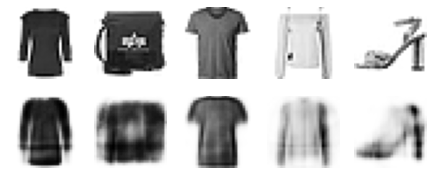

In [28]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

## Using Convolutional Layers Instead of Dense Layers

Let's build a stacked Autoencoder with 3 hidden layers and 1 output layers (i.e., 2 stacked Autoencoders).

In [29]:
conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu",
                                 input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])

conv_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                metrics=[rounded_accuracy])
history = conv_ae.fit(X_train, X_train, epochs=5,
                      validation_data=(X_val, X_val))

Epoch 1/5
1719/1719 [==============================] - 22s 6ms/step - loss: 0.2995 - rounded_accuracy: 0.9205 - val_loss: 0.2791 - val_rounded_accuracy: 0.9381
Epoch 2/5
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2748 - rounded_accuracy: 0.9422 - val_loss: 0.2724 - val_rounded_accuracy: 0.9461
Epoch 3/5
1719/1719 [==============================] - 13s 7ms/step - loss: 0.2706 - rounded_accuracy: 0.9464 - val_loss: 0.2718 - val_rounded_accuracy: 0.9441
Epoch 4/5
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2682 - rounded_accuracy: 0.9489 - val_loss: 0.2681 - val_rounded_accuracy: 0.9505
Epoch 5/5
1719/1719 [==============================] - 12s 7ms/step - loss: 0.2665 - rounded_accuracy: 0.9505 - val_loss: 0.2694 - val_rounded_accuracy: 0.9500


In [30]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_3 (Reshape)         (None, 28, 28, 1)         0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 7, 7, 32)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)        

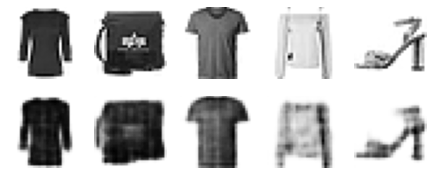

In [31]:
show_reconstructions(conv_ae)
plt.show()

# Recurrent Autoencoders

In [32]:
recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[28,28]),
    keras.layers.LSTM(30)
])
recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
])
recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(0.1),
                     metrics=[rounded_accuracy])

In [33]:
history = recurrent_ae.fit(X_train, X_train, epochs=10, validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 32s 16ms/step - loss: 0.5093 - rounded_accuracy: 0.7614 - val_loss: 0.4432 - val_rounded_accuracy: 0.8198
Epoch 2/10
1719/1719 [==============================] - 26s 15ms/step - loss: 0.4046 - rounded_accuracy: 0.8407 - val_loss: 0.3778 - val_rounded_accuracy: 0.8595
Epoch 3/10
1719/1719 [==============================] - 25s 14ms/step - loss: 0.3663 - rounded_accuracy: 0.8705 - val_loss: 0.3587 - val_rounded_accuracy: 0.8772
Epoch 4/10
1719/1719 [==============================] - 24s 14ms/step - loss: 0.3526 - rounded_accuracy: 0.8803 - val_loss: 0.3474 - val_rounded_accuracy: 0.8848
Epoch 5/10
1719/1719 [==============================] - 25s 14ms/step - loss: 0.3425 - rounded_accuracy: 0.8866 - val_loss: 0.3380 - val_rounded_accuracy: 0.8905
Epoch 6/10
1719/1719 [==============================] - 25s 15ms/step - loss: 0.3350 - rounded_accuracy: 0.8909 - val_loss: 0.3344 - val_rounded_accuracy: 0.8914
Epoch 7/10
1719/1719 [======

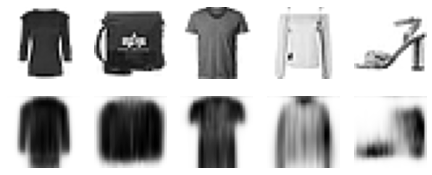

In [34]:
show_reconstructions(recurrent_ae)
plt.show()

## Stacked Denoising Autoencoder

In [35]:
# With Gaussian Noise

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=0.90),
                     metrics=[rounded_accuracy])
history = denoising_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3517 - rounded_accuracy: 0.8759 - val_loss: 0.3178 - val_rounded_accuracy: 0.9043
Epoch 2/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3126 - rounded_accuracy: 0.9096 - val_loss: 0.3094 - val_rounded_accuracy: 0.9116
Epoch 3/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3057 - rounded_accuracy: 0.9154 - val_loss: 0.3033 - val_rounded_accuracy: 0.9189
Epoch 4/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.3018 - rounded_accuracy: 0.9188 - val_loss: 0.2993 - val_rounded_accuracy: 0.9234
Epoch 5/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.2986 - rounded_accuracy: 0.9217 - val_loss: 0.2964 - val_rounded_accuracy: 0.9251
Epoch 6/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.2964 - rounded_accuracy: 0.9236 - val_loss: 0.2945 - val_rounded_accuracy: 0.9276
Epoch 7/10
1719/1719 [============

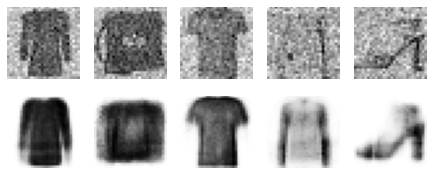

In [36]:
noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_val, training=True))
plt.show()

In [37]:
# Example using Dropout
dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])
dropout_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=0.9),
                   metrics=[rounded_accuracy])
history = dropout_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3642 - rounded_accuracy: 0.8651 - val_loss: 0.3244 - val_rounded_accuracy: 0.9005
Epoch 2/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.3208 - rounded_accuracy: 0.9010 - val_loss: 0.3144 - val_rounded_accuracy: 0.9084
Epoch 3/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3150 - rounded_accuracy: 0.9057 - val_loss: 0.3097 - val_rounded_accuracy: 0.9126
Epoch 4/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3110 - rounded_accuracy: 0.9090 - val_loss: 0.3062 - val_rounded_accuracy: 0.9161
Epoch 5/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3081 - rounded_accuracy: 0.9113 - val_loss: 0.3031 - val_rounded_accuracy: 0.9176
Epoch 6/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3059 - rounded_accuracy: 0.9132 - val_loss: 0.3014 - val_rounded_accuracy: 0.9193
Epoch 7/10
1719/1719 [============

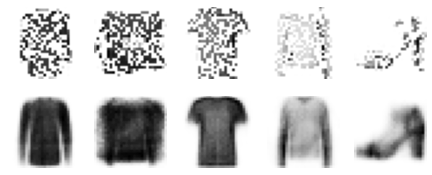

In [38]:
dropout = keras.layers.Dropout(0.5)
show_reconstructions(dropout_ae, dropout(X_val, training=True))

## Sparse Autoencoder

Let's build a simple stacked autoencoder, so we can compare it to the sparse autoencoders we will build. This time we will use the sigmoid activation function for the coding layer, to ensure that the coding values range from 0 to 1:

In [39]:
simple_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="sigmoid"),
])
simple_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
simple_ae = keras.models.Sequential([simple_encoder, simple_decoder])
simple_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=0.9),
                  metrics=[rounded_accuracy])
history = simple_ae.fit(X_train, X_train, epochs=10,
                        validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.4369 - rounded_accuracy: 0.7928 - val_loss: 0.3805 - val_rounded_accuracy: 0.8475
Epoch 2/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3688 - rounded_accuracy: 0.8586 - val_loss: 0.3601 - val_rounded_accuracy: 0.8723
Epoch 3/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3474 - rounded_accuracy: 0.8811 - val_loss: 0.3434 - val_rounded_accuracy: 0.8804
Epoch 4/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3321 - rounded_accuracy: 0.8941 - val_loss: 0.3286 - val_rounded_accuracy: 0.9002
Epoch 5/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3232 - rounded_accuracy: 0.9007 - val_loss: 0.3228 - val_rounded_accuracy: 0.9013
Epoch 6/10
1719/1719 [==============================] - 11s 6ms/step - loss: 0.3191 - rounded_accuracy: 0.9034 - val_loss: 0.3194 - val_rounded_accuracy: 0.9032
Epoch 7/10
1719/1719 [============

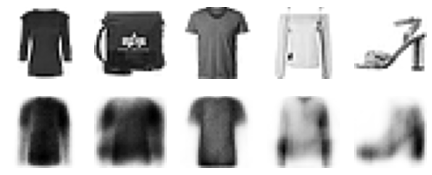

In [40]:
show_reconstructions(simple_ae)
plt.show()

Now we will create a couple functions to print nice activation histograms:

In [41]:
def plot_percent(ax, data, bins):
    counts, _ = np.histogram(data, bins=bins)
    widths = bins[1:] - bins[:-1]
    x = bins[:-1] + widths / 2
    ax.bar(x, counts / len(data), width=widths*0.8)
    ax.xaxis.set_ticks(bins)
    ax.yaxis.set_major_formatter(mpl.ticker.FuncFormatter(
        lambda y, position: "{}%".format(int(np.round(100 * y)))))
    ax.grid(True)

In [42]:
def plot_activations_histogram(encoder, height=1, n_bins=10):
    X_valid_codings = encoder(X_val).numpy()
    activation_means = X_valid_codings.mean(axis=0)
    mean = activation_means.mean()
    bins = np.linspace(0, 1, n_bins + 1)

    fig, [ax1, ax2] = plt.subplots(figsize=(10, 3), nrows=1, ncols=2, sharey=True)
    plot_percent(ax1, X_valid_codings.ravel(), bins)
    ax1.plot([mean, mean], [0, height], "k--", label="Overall Mean = {:.2f}".format(mean))
    ax1.legend(loc="upper center", fontsize=14)
    ax1.set_xlabel("Activation")
    ax1.set_ylabel("% Activations")
    ax1.axis([0, 1, 0, height])
    plot_percent(ax2, activation_means, bins)
    ax2.plot([mean, mean], [0, height], "k--")
    ax2.set_xlabel("Neuron Mean Activation")
    ax2.set_ylabel("% Neurons")
    ax2.axis([0, 1, 0, height])

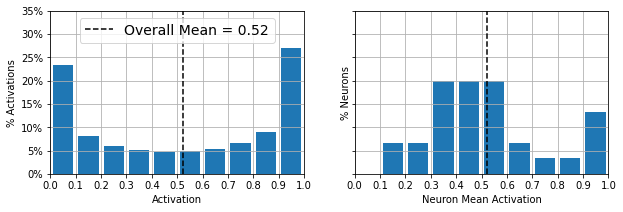

In [43]:
plot_activations_histogram(simple_encoder, height=0.35)
plt.show()

In the above histogram, the one on the left shows the distribution of all activations. They typically are either zero or one, but there is a decent range between 0 and 1 as well. This is due to the sigmoid activation function. The one on the right shows the distribution of mean neuron activation which tends towards 0.5.

Now we will return to our sparse encoder but now we will add some regularization. Specifically L1 Regularization:

In [44]:
sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=keras.regularizers.l1(1e-4))
])
sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])
sparse_l1_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
                     metrics=[rounded_accuracy])
history = sparse_l1_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3971 - rounded_accuracy: 0.8376 - val_loss: 0.3556 - val_rounded_accuracy: 0.8816
Epoch 2/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3365 - rounded_accuracy: 0.8960 - val_loss: 0.3300 - val_rounded_accuracy: 0.9031
Epoch 3/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3231 - rounded_accuracy: 0.9053 - val_loss: 0.3219 - val_rounded_accuracy: 0.9061
Epoch 4/10
1719/1719 [==============================] - 11s 7ms/step - loss: 0.3172 - rounded_accuracy: 0.9092 - val_loss: 0.3167 - val_rounded_accuracy: 0.9097
Epoch 5/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3126 - rounded_accuracy: 0.9126 - val_loss: 0.3125 - val_rounded_accuracy: 0.9141
Epoch 6/10
1719/1719 [==============================] - 12s 7ms/step - loss: 0.3092 - rounded_accuracy: 0.9151 - val_loss: 0.3095 - val_rounded_accuracy: 0.9152
Epoch 7/10
1719/1719 [============

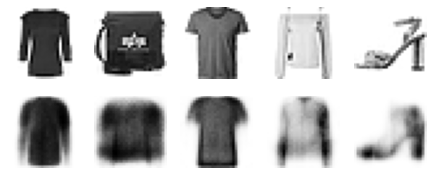

In [45]:
show_reconstructions(sparse_l1_ae)

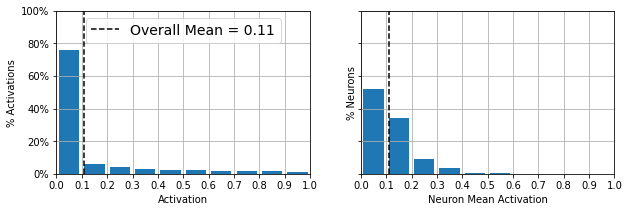

In [46]:
plot_activations_histogram(sparse_l1_encoder, height=1.)
plt.show()

Now, let's use the KL Divergence loss instead to ensure sparsity, and target 10% sparsity:

(0.0, 1.0, 0.0, 0.95)

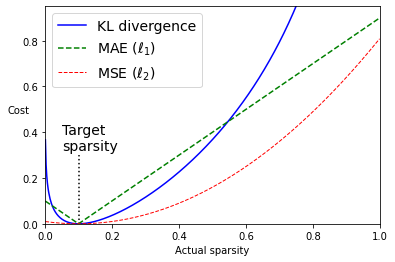

In [47]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])

In [48]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

In [49]:
class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target
    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [50]:
kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])
sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])
sparse_kl_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0),
              metrics=[rounded_accuracy])
history = sparse_kl_ae.fit(X_train, X_train, epochs=10,
                           validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 13s 7ms/step - loss: 0.4137 - rounded_accuracy: 0.8136 - val_loss: 0.3688 - val_rounded_accuracy: 0.8626
Epoch 2/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3497 - rounded_accuracy: 0.8801 - val_loss: 0.3407 - val_rounded_accuracy: 0.8878
Epoch 3/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3303 - rounded_accuracy: 0.8954 - val_loss: 0.3263 - val_rounded_accuracy: 0.9008
Epoch 4/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3205 - rounded_accuracy: 0.9032 - val_loss: 0.3201 - val_rounded_accuracy: 0.9041
Epoch 5/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3160 - rounded_accuracy: 0.9069 - val_loss: 0.3163 - val_rounded_accuracy: 0.9070
Epoch 6/10
1719/1719 [==============================] - 14s 8ms/step - loss: 0.3127 - rounded_accuracy: 0.9098 - val_loss: 0.3133 - val_rounded_accuracy: 0.9104
Epoch 7/10
1719/1719 [============

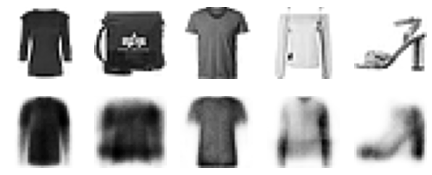

In [51]:
show_reconstructions(sparse_kl_ae)

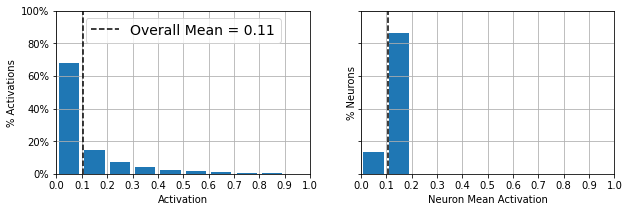

In [52]:
plot_activations_histogram(sparse_kl_encoder)
plt.show()

# Variational Autoencoder

In [53]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean 

In [54]:
codings_size = 10

inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.models.Model(
    inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

latent_loss = -0.5 * K.sum(
    1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean),
    axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop", metrics=[rounded_accuracy])
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128,
                             validation_data=(X_val, X_val))

Epoch 1/25
430/430 [==============================] - 8s 17ms/step - loss: 0.3890 - rounded_accuracy: 0.8617 - val_loss: 0.3553 - val_rounded_accuracy: 0.8947
Epoch 2/25
430/430 [==============================] - 7s 16ms/step - loss: 0.3428 - rounded_accuracy: 0.8981 - val_loss: 0.3432 - val_rounded_accuracy: 0.9010
Epoch 3/25
430/430 [==============================] - 7s 16ms/step - loss: 0.3322 - rounded_accuracy: 0.9059 - val_loss: 0.3326 - val_rounded_accuracy: 0.9035
Epoch 4/25
430/430 [==============================] - 7s 16ms/step - loss: 0.3269 - rounded_accuracy: 0.9099 - val_loss: 0.3294 - val_rounded_accuracy: 0.9037
Epoch 5/25
430/430 [==============================] - 7s 17ms/step - loss: 0.3239 - rounded_accuracy: 0.9122 - val_loss: 0.3251 - val_rounded_accuracy: 0.9138
Epoch 6/25
430/430 [==============================] - 7s 17ms/step - loss: 0.3219 - rounded_accuracy: 0.9139 - val_loss: 0.3233 - val_rounded_accuracy: 0.9100
Epoch 7/25
430/430 [==========================

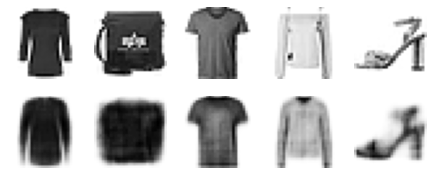

In [55]:
show_reconstructions(variational_ae)
plt.show()

## Generate Fashion Images

In [56]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

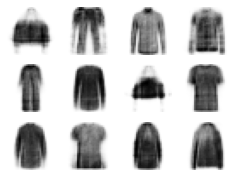

In [57]:
codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4) # Random plotted images

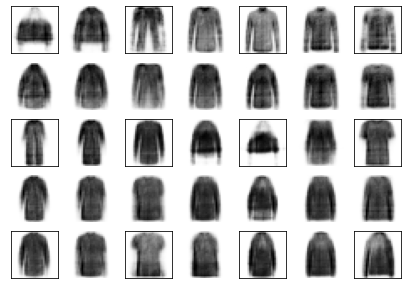

In [58]:
codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()

plt.figure(figsize=(7, 5))
for index, image in enumerate(images):
    plt.subplot(5, 7, index + 1)
    if index%7%2==0 and index//7%2==0:
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
    else:
        plt.axis("off")
    plt.imshow(image, cmap="binary")

## Generative Adversarial Networks (GANs)

In [59]:
codings_size = 30

generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [60]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [61]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [62]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=50):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))            
        for X_batch in dataset:
            # phase 1 - training the discriminator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            # phase 2 - training the generator
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)                    
        plt.show()

Epoch 1/1


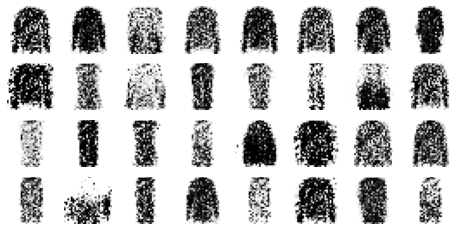

In [63]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

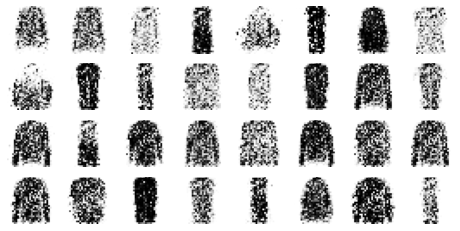

In [64]:
noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

Epoch 1/50


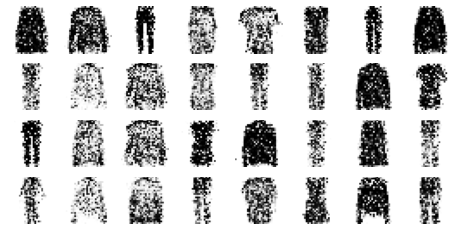

Epoch 2/50


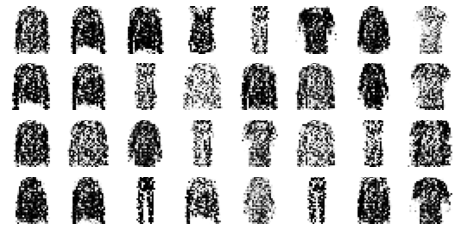

Epoch 3/50


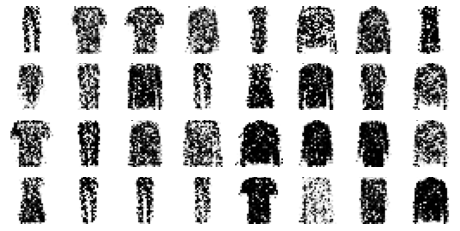

Epoch 4/50


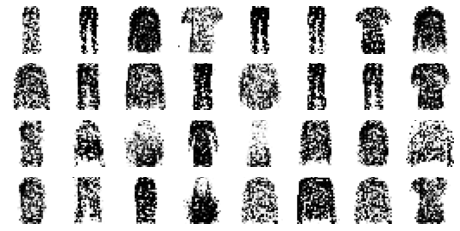

Epoch 5/50


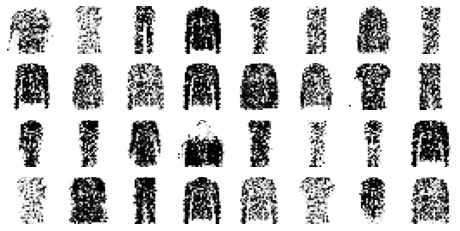

Epoch 6/50


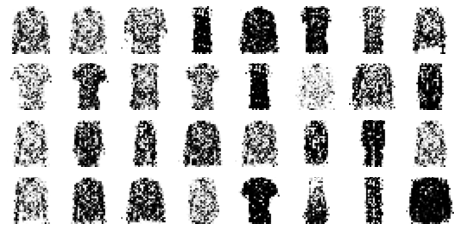

Epoch 7/50


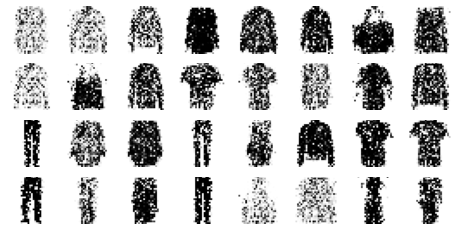

Epoch 8/50


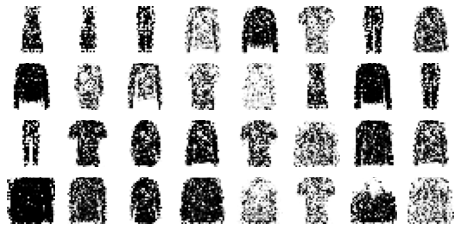

Epoch 9/50


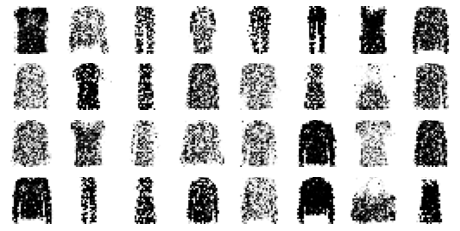

Epoch 10/50


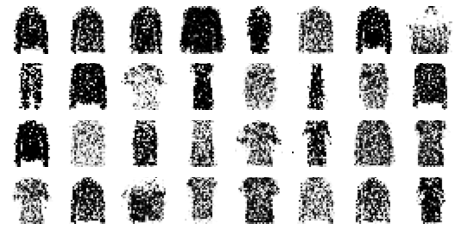

Epoch 11/50


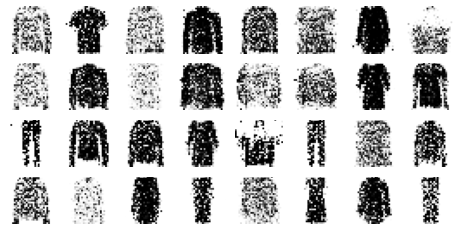

Epoch 12/50


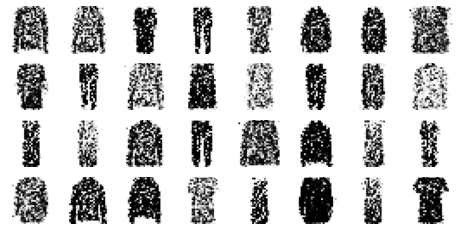

Epoch 13/50


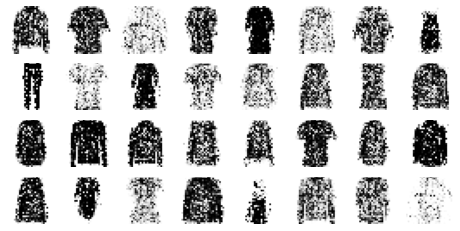

Epoch 14/50


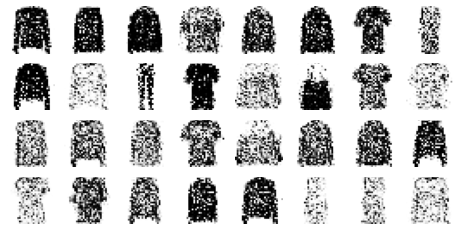

Epoch 15/50


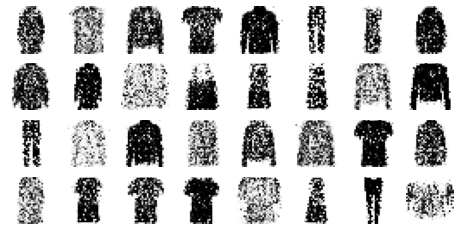

Epoch 16/50


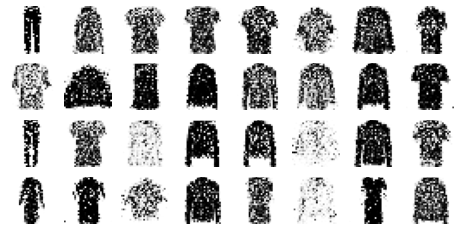

Epoch 17/50


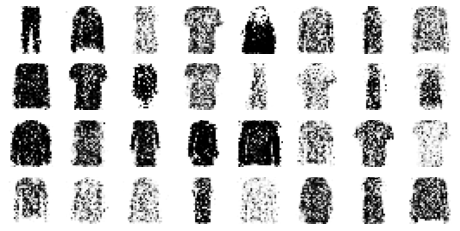

Epoch 18/50


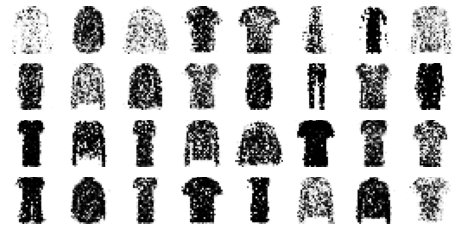

Epoch 19/50


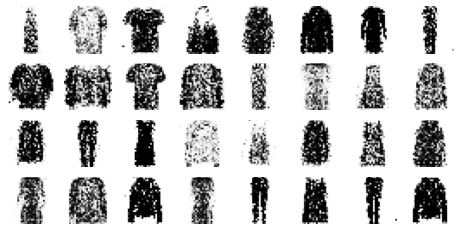

Epoch 20/50


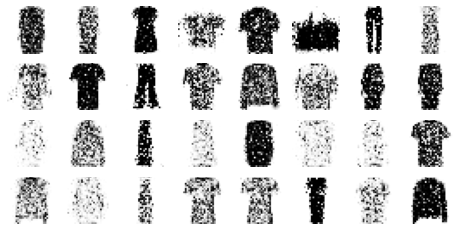

Epoch 21/50


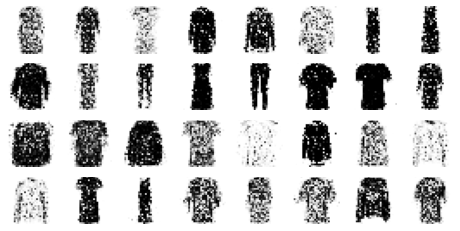

Epoch 22/50


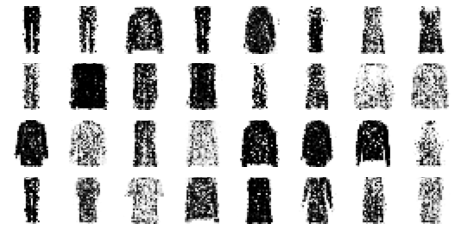

Epoch 23/50


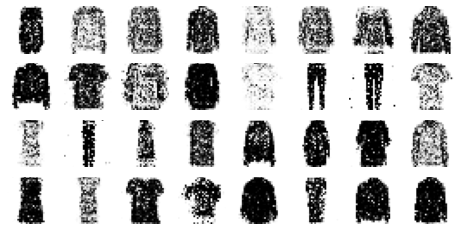

Epoch 24/50


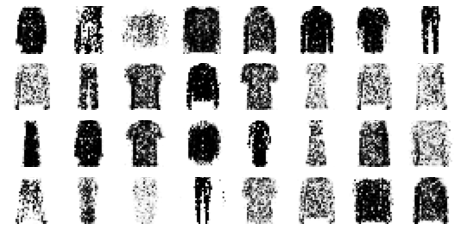

Epoch 25/50


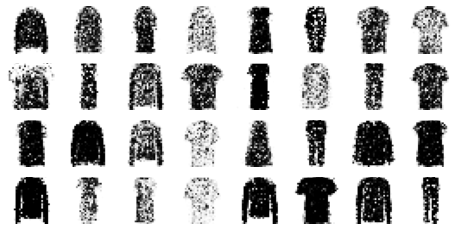

Epoch 26/50


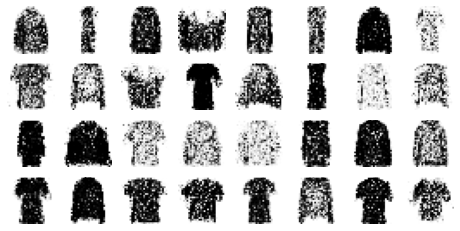

Epoch 27/50


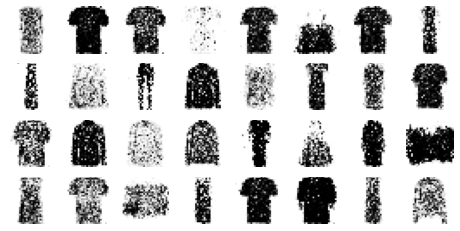

Epoch 28/50


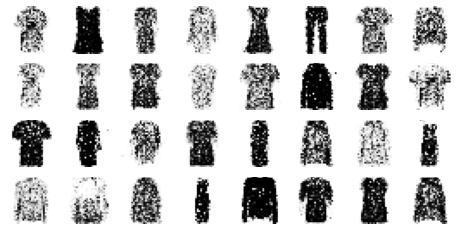

Epoch 29/50


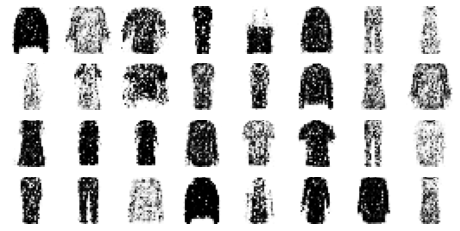

Epoch 30/50


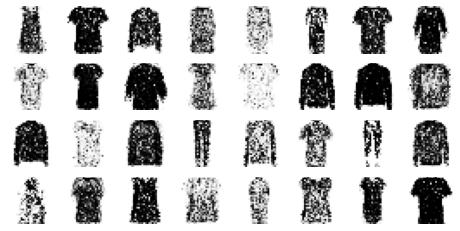

Epoch 31/50


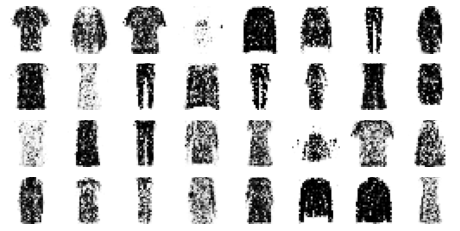

Epoch 32/50


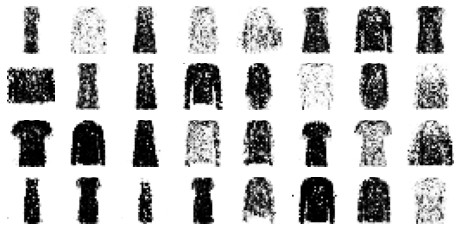

Epoch 33/50


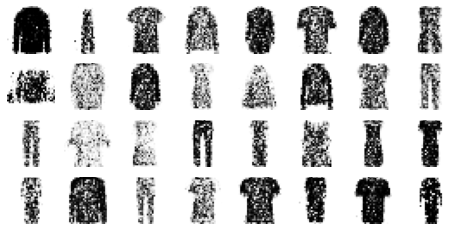

Epoch 34/50


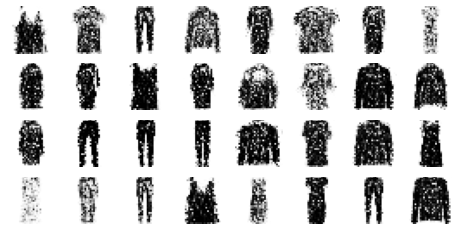

Epoch 35/50


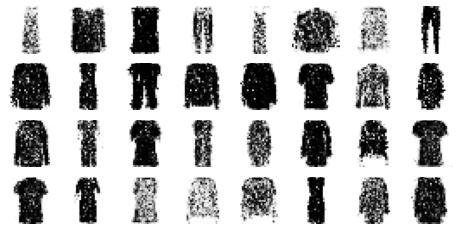

Epoch 36/50


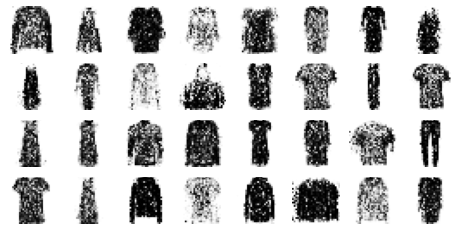

Epoch 37/50


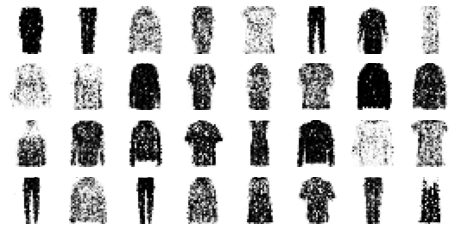

Epoch 38/50


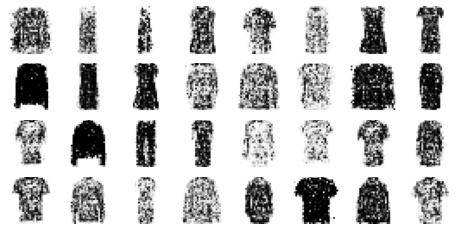

Epoch 39/50


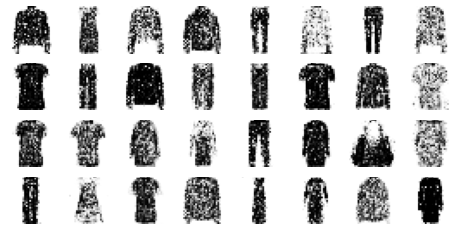

Epoch 40/50


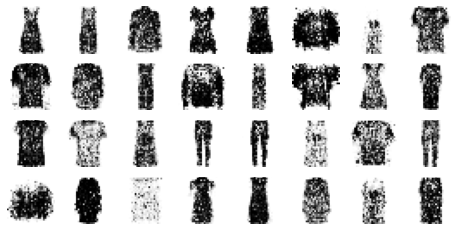

Epoch 41/50


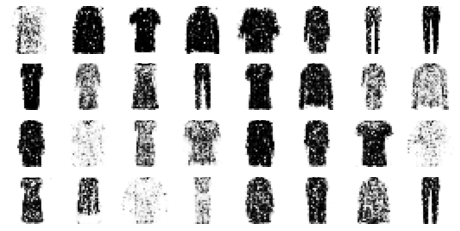

Epoch 42/50


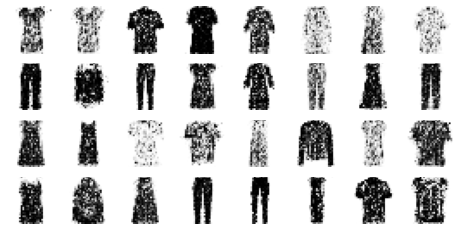

Epoch 43/50


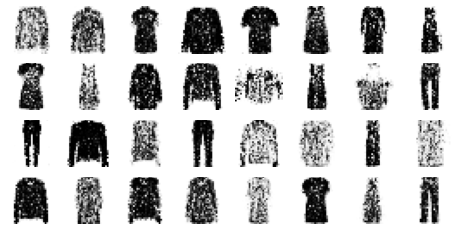

Epoch 44/50


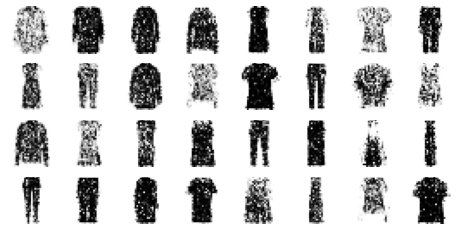

Epoch 45/50


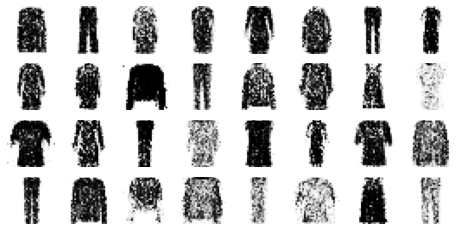

Epoch 46/50


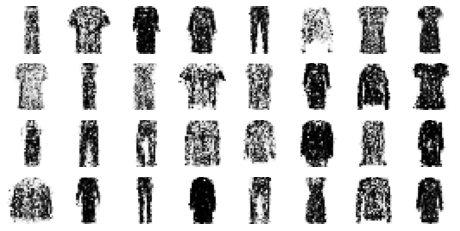

Epoch 47/50


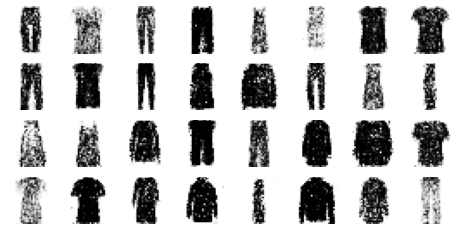

Epoch 48/50


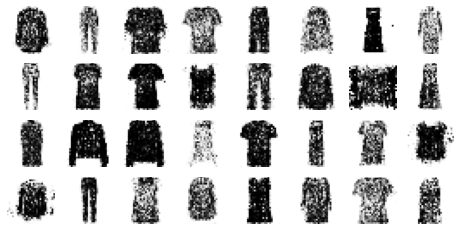

Epoch 49/50


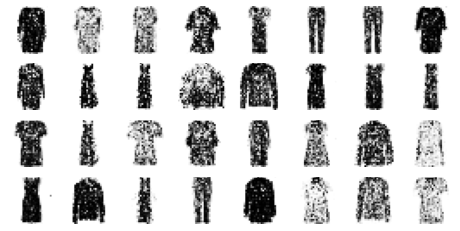

Epoch 50/50


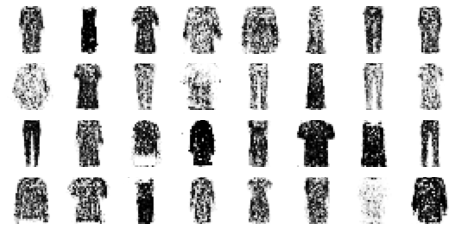

In [65]:
train_gan(gan, dataset, batch_size, codings_size)

## Deep Convolutional GAN

In [66]:
codings_size = 100

generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME",
                                 activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME",
                                 activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME",
                        activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [67]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [68]:
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1. # reshape and rescale

In [69]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/50


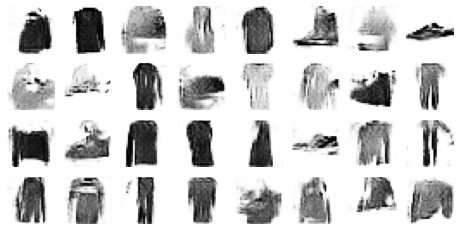

Epoch 2/50


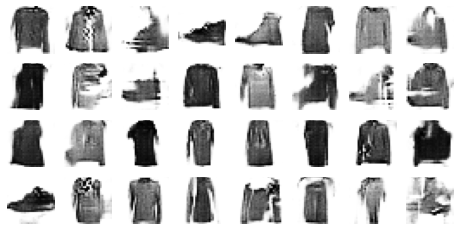

Epoch 3/50


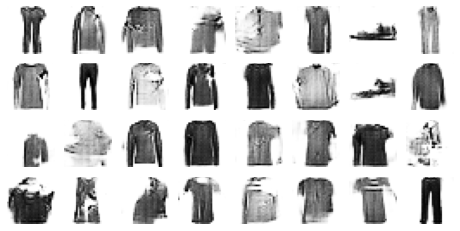

Epoch 4/50


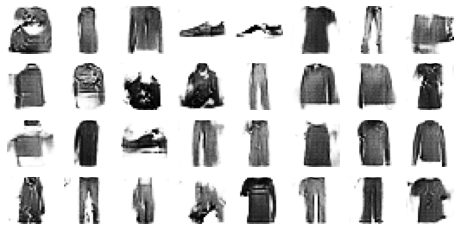

Epoch 5/50


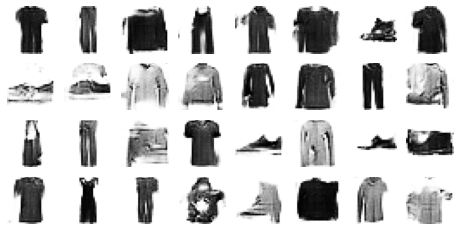

Epoch 6/50


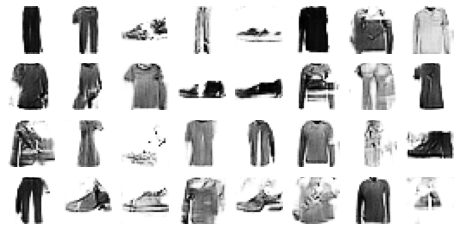

Epoch 7/50


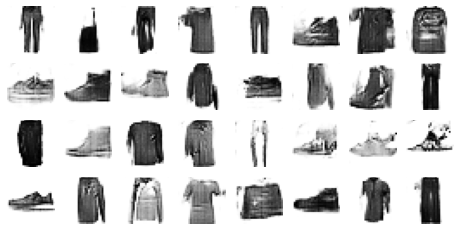

Epoch 8/50


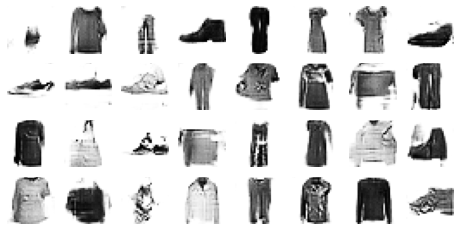

Epoch 9/50


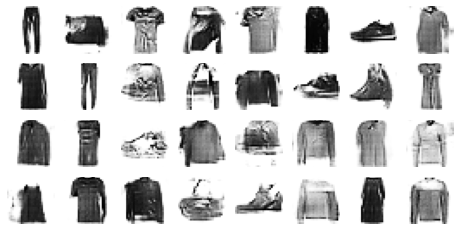

Epoch 10/50


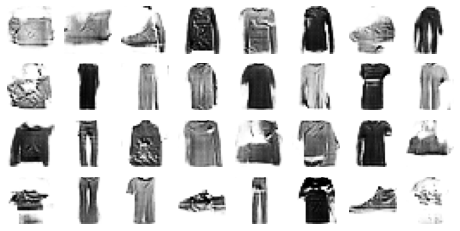

Epoch 11/50


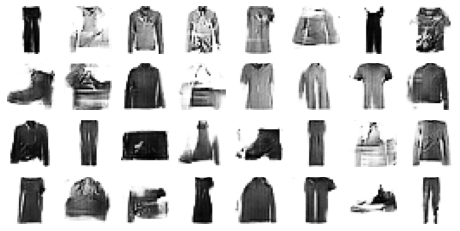

Epoch 12/50


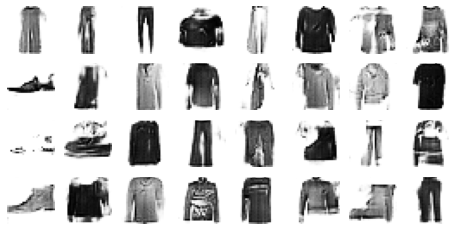

Epoch 13/50


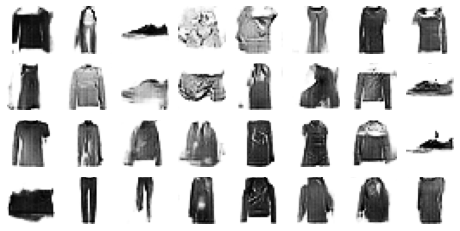

Epoch 14/50


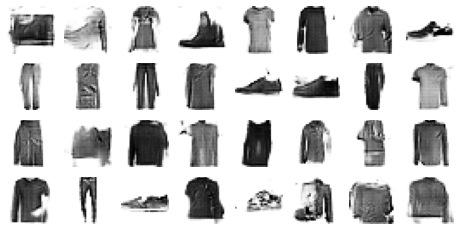

Epoch 15/50


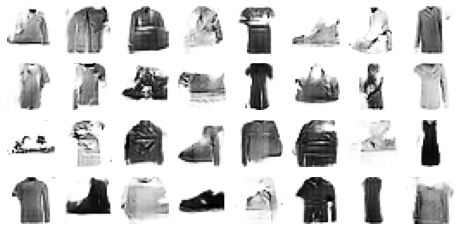

Epoch 16/50


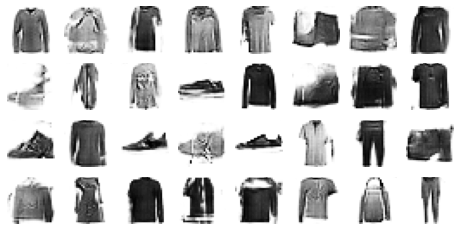

Epoch 17/50


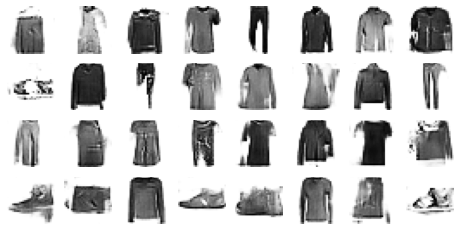

Epoch 18/50


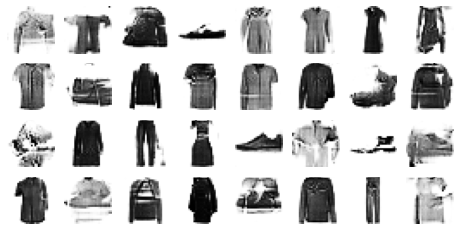

Epoch 19/50


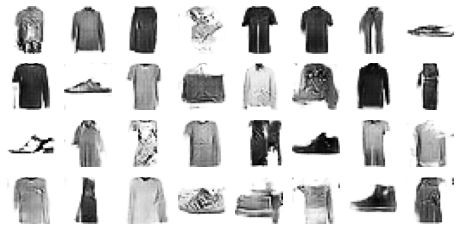

Epoch 20/50


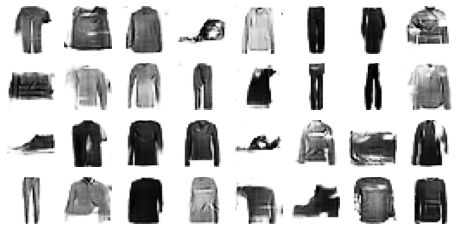

Epoch 21/50


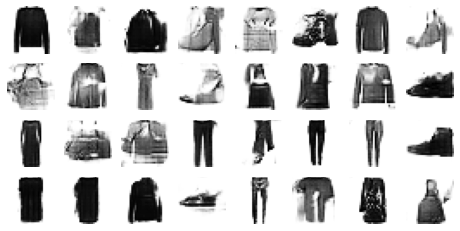

Epoch 22/50


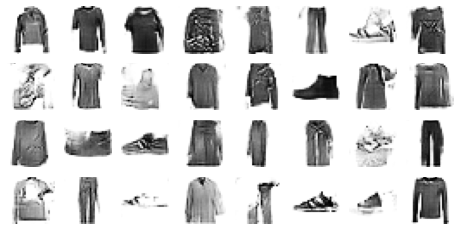

Epoch 23/50


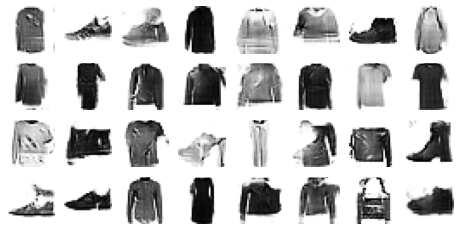

Epoch 24/50


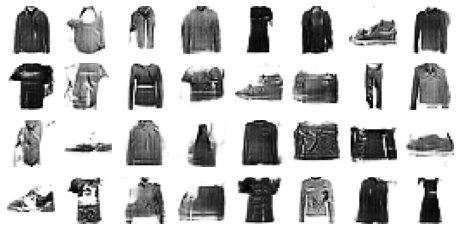

Epoch 25/50


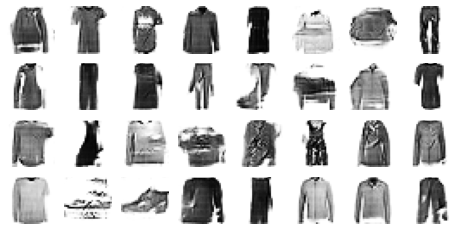

Epoch 26/50


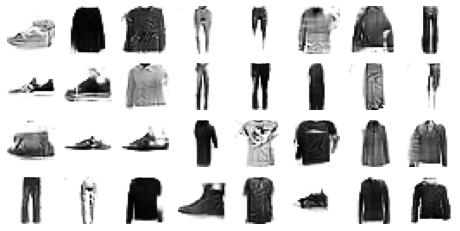

Epoch 27/50


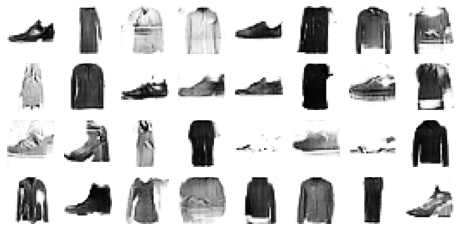

Epoch 28/50


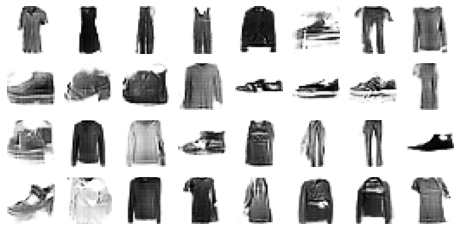

Epoch 29/50


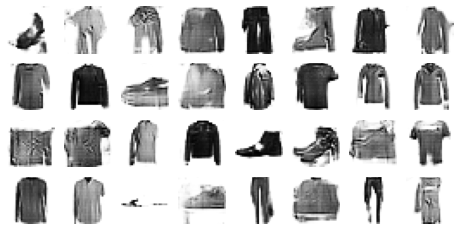

Epoch 30/50


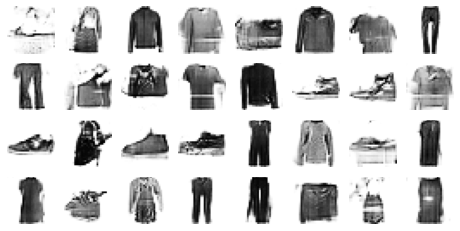

Epoch 31/50


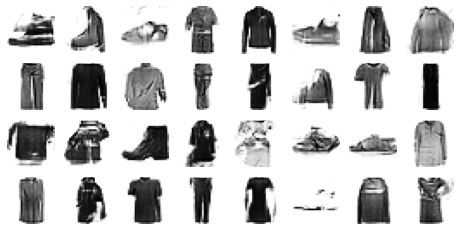

Epoch 32/50


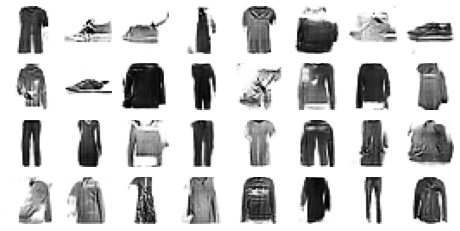

Epoch 33/50


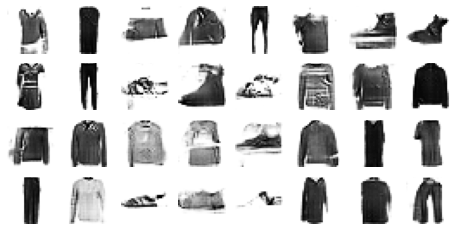

Epoch 34/50


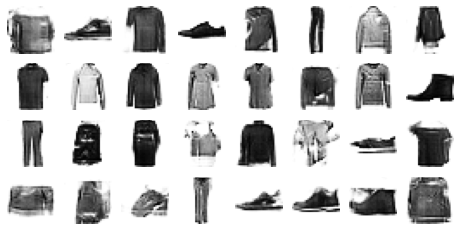

Epoch 35/50


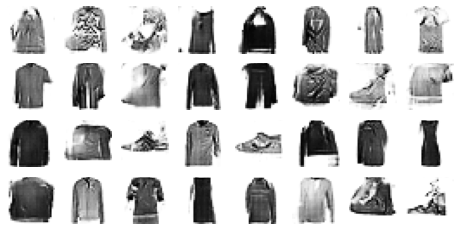

Epoch 36/50


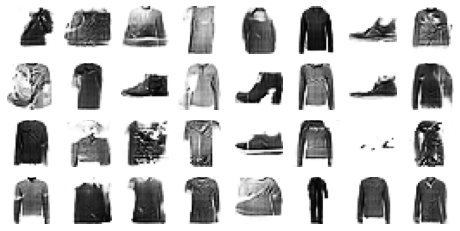

Epoch 37/50


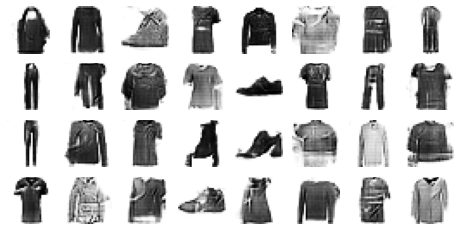

Epoch 38/50


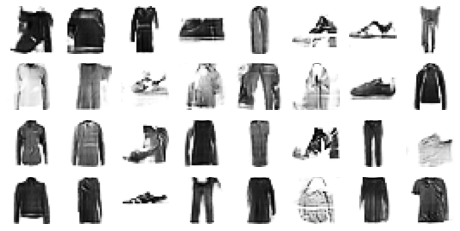

Epoch 39/50


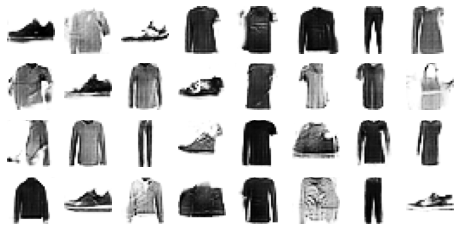

Epoch 40/50


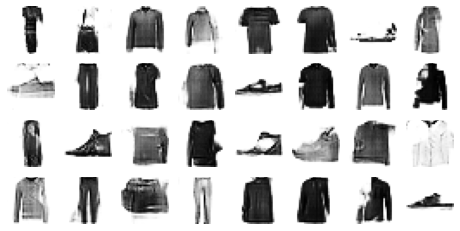

Epoch 41/50


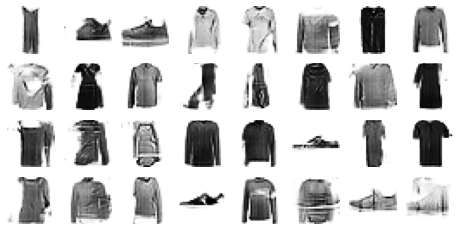

Epoch 42/50


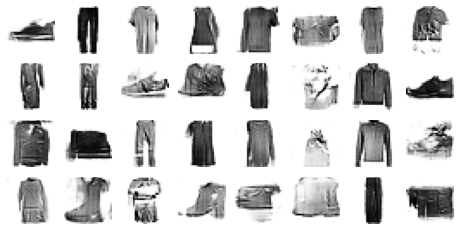

Epoch 43/50


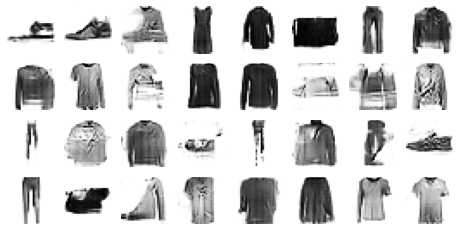

Epoch 44/50


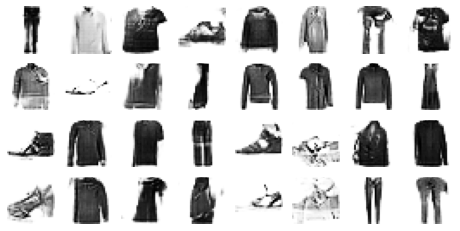

Epoch 45/50


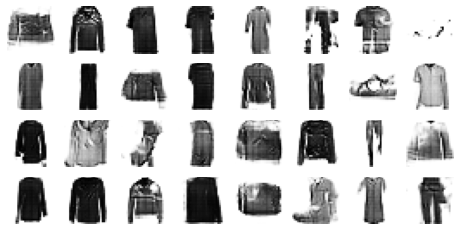

Epoch 46/50


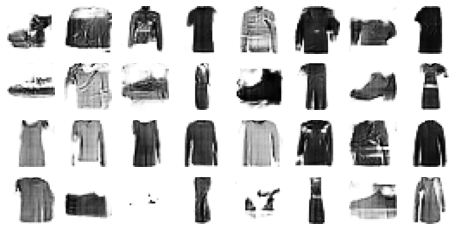

Epoch 47/50


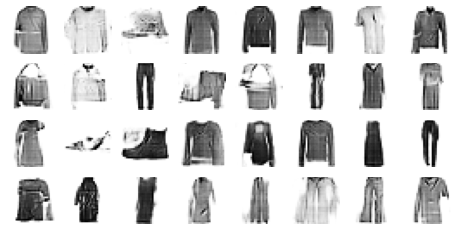

Epoch 48/50


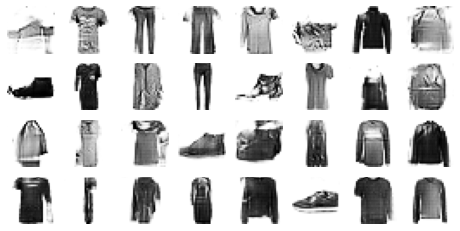

Epoch 49/50


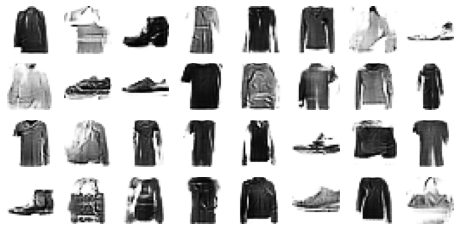

Epoch 50/50


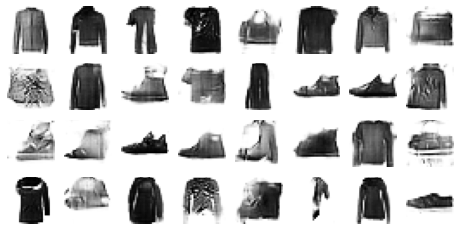

In [70]:
train_gan(gan, dataset, batch_size, codings_size)

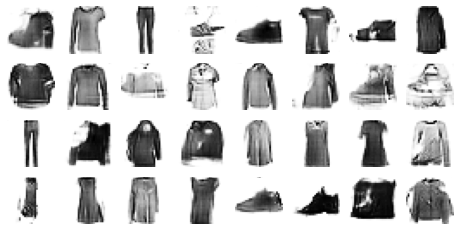

In [71]:
noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

## Extra Material

## Hashing Using a Binary Autoencoder

Loading the Fashions MNIST dataset again:

In [72]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

Now to train an autoencoder where the encoder has a 16-neuron output layer, using the sigmoid activation function, and heavy Gaussian noise just before it. During training, the noise layer will encourage the previous layer to learn to output large values, since small values will just be crushed by the noise. In turn, this means that the output layer will output values close to 0 or 1, thanks to the sigmoid activation function. From here, the output values are rounded to 0s and 1s, and the result is a 16-bit "semantic" hash. If everything works well, images that look alike will have the same hash. This can be very useful for search engines: for example, if we store each image on a server identified by the image's semantic hash, then all similar images will end up on the same server. Users of the search engine can then provide an image to search for, and the search engine will compute the image's hash using the encoder, and quickly return all the images on the server identified by that hash.

In [73]:
hashing_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.GaussianNoise(15.),
    keras.layers.Dense(16, activation="sigmoid"),
])
hashing_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[16]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
hashing_ae = keras.models.Sequential([hashing_encoder, hashing_decoder])
hashing_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Nadam(),
                   metrics=[rounded_accuracy])
history = hashing_ae.fit(X_train, X_train, epochs=10,
                         validation_data=(X_val, X_val))

Epoch 1/10
1719/1719 [==============================] - 24s 14ms/step - loss: 0.4050 - rounded_accuracy: 0.8144 - val_loss: 0.3832 - val_rounded_accuracy: 0.8258
Epoch 2/10
1719/1719 [==============================] - 23s 13ms/step - loss: 0.3627 - rounded_accuracy: 0.8536 - val_loss: 0.3621 - val_rounded_accuracy: 0.8494
Epoch 3/10
1719/1719 [==============================] - 23s 13ms/step - loss: 0.3536 - rounded_accuracy: 0.8628 - val_loss: 0.3558 - val_rounded_accuracy: 0.8568
Epoch 4/10
1719/1719 [==============================] - 23s 13ms/step - loss: 0.3494 - rounded_accuracy: 0.8673 - val_loss: 0.3532 - val_rounded_accuracy: 0.8582
Epoch 5/10
1719/1719 [==============================] - 23s 14ms/step - loss: 0.3463 - rounded_accuracy: 0.8702 - val_loss: 0.3490 - val_rounded_accuracy: 0.8674
Epoch 6/10
1719/1719 [==============================] - 24s 14ms/step - loss: 0.3440 - rounded_accuracy: 0.8731 - val_loss: 0.3445 - val_rounded_accuracy: 0.8757
Epoch 7/10
1719/1719 [======

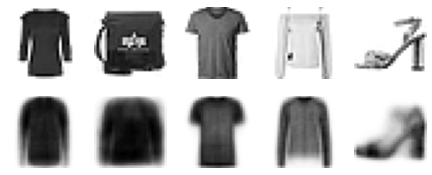

In [74]:
show_reconstructions(hashing_ae)
plt.show()

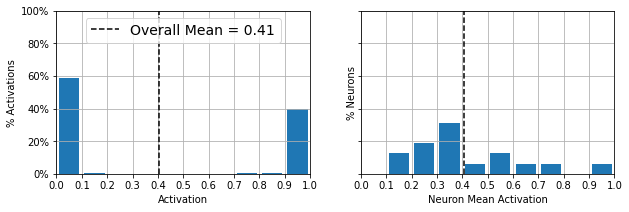

In [75]:
plot_activations_histogram(hashing_encoder)
plt.show()

In [76]:
# Hashes for first few images in validation set
hashes = np.round(hashing_encoder.predict(X_valid)).astype(np.int32)
hashes *= np.array([[2**bit for bit in range(16)]])
hashes = hashes.sum(axis=1)
for h in hashes[:5]:
    print("{:016b}".format(h))
print("...")

1001100011100000
0001100001000000
0001001011100000
1011010011000000
0100010000000010
...


Now let's find the most common image hashes in the validation set, and display a few images for each hash. In the following image, all the images on a given row have the same hash:

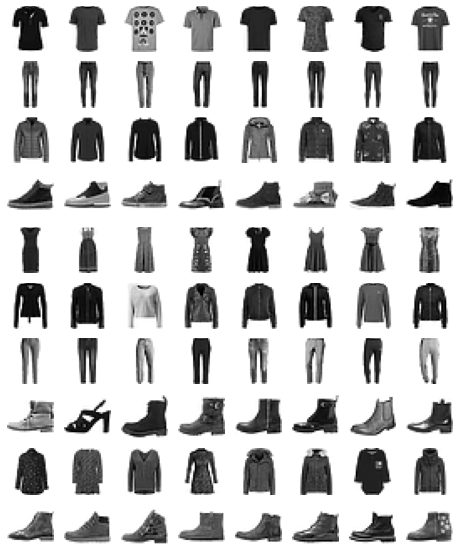

In [77]:
from collections import Counter

n_hashes = 10
n_images = 8

top_hashes = Counter(hashes).most_common(n_hashes)

plt.figure(figsize=(n_images, n_hashes))
for hash_index, (image_hash, hash_count) in enumerate(top_hashes):
    indices = (hashes == image_hash)
    for index, image in enumerate(X_valid[indices][:n_images]):
        plt.subplot(n_hashes, n_images, hash_index * n_images + index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

# End of Chapter Exercises

1. What are the main tasks that autoencoders are used for?
2. Suppose you want to train a classifier, and you have plenty of unlabeled training
data but only a few thousand labeled instances. How can autoencoders help?
How would you proceed?
3. If an autoencoder perfectly reconstructs the inputs, is it necessarily a good
autoencoder? How can you evaluate the performance of an autoencoder?
4. What are undercomplete and overcomplete autoencoders? What is the main risk
of an excessively undercomplete autoencoder? What about the main risk of an
overcomplete autoencoder?
5. How do you tie weights in a stacked autoencoder? What is the point of doing so?
6. What is a generative model? Can you name a type of generative autoencoder?
7. What is a GAN? Can you name a few tasks where GANs can shine?
8. What are the main difficulties when training GANs?
9. Try using a denoising autoencoder to pretrain an image classifier. You can use
MNIST (the simplest option), or a more complex image dataset such as CIFAR10
if you want a bigger challenge. Regardless of the dataset you’re using, follow these
steps:
- Split the dataset into a training set and a test set. Train a deep denoising
autoencoder on the full training set.
- Check that the images are fairly well reconstructed. Visualize the images that
most activate each neuron in the coding layer.
- Build a classification DNN, reusing the lower layers of the autoencoder. Train
it using only 500 images from the training set. Does it perform better with or
without pretraining?
10. Train a variational autoencoder on the image dataset of your choice, and use it to
generate images. Alternatively, you can try to find an unlabeled dataset that you
are interested in and see if you can generate new samples.
11. Train a DCGAN to tackle the image dataset of your choice, and use it to generate
images. Add experience replay and see if this helps. Turn it into a conditional
GAN where you can control the generated class

***1. What are the main tasks that autoencoders are used for?*** 
A: Autoencoders are mainly used for Unsupervised training on unlabled data, Genertive models and can be used with PCA in dimensionality reduction.

***2. Suppose you want to train a classifier, and you have plenty of unlabeled training
data but only a few thousand labeled instances. How can autoencoders help?
How would you proceed?***
A: Autoencoders are very useful in this situation. You could begin by training a deep autoencoders on the dataset and then reuse the classifer to train and classify the unlabeled data using the labeled data. If the labeled data is very small, it may be best to freeze the reused layers for training the classifier.

***3. If an autoencoder perfectly reconstructs the inputs, is it necessarily a good
autoencoder? How can you evaluate the performance of an autoencoder?***
A: Not at all. There is a possibility that is an overcomplete autoencoder, so if it shown new images, it may do quite poorly on them. For evaluating performance on autoencoders, this can be done with the MSE on the outputs and inputs for the autoencoders. So a low reconstruction loss would help with this task, but it is not guarenteed to work and produce a good result. Another way is by validating and studying the classifier's performance. 

***4. What are undercomplete and overcomplete autoencoders? What is the main risk
of an excessively undercomplete autoencoder? What about the main risk of an
overcomplete autoencoder?***

A: An underecomplete autoencoder involves an autoencoder that has coding layers smaller than the input and output layers. If it is larger than the input and output layers, it is an overcomplete autoencoder. The main risk of an undercomplete autoencoder is it may do very poorly at reconstructing images. With an overcomplete autoencoder, it may just copy the inputs as the outputs and perform poorly on new images fed to the autoencoder. 

***5. How do you tie weights in a stacked autoencoder? What is the point of doing so?***
A: In order to tie weights in a stacked autoencoder, when putting together the encoder and decoder layers, the decoder weights need to be equal to the transpose of the encoder weights, so when performing matrix multiplication there won't be any issues. Also, this reduces the number of parameters needed in the model by about half, which will help overall with training speed, and convergence.

***6. What is a generative model? Can you name a type of generative autoencoder?***
A: A generative model is a model that trains on a training set, and then randomly generates new outputs that look like the training set examples. So in this chapter, we built a generate model to output new MNIST pictures for shirts, shoes, purses, etc. that are of a unique design but similar to the training set examples. A generate autoencoder example is a variational autoencoder.

***7. What is a GAN? Can you name a few tasks where GANs can shine?***
A: A GAN (Generative Adversarial Network) is a neural network architecture that contained a generator and a discriminator. They partake in a cat and mouse game where the generator is trying to generate fake examples similar to the training set to fool the discriminator. On the other hand, the discriminator is trying to determine which examples are fake and which ones are the real examples from the training set. It will eventually get to a point where there is a nash equalibrium between them where if either the generaotr or discriminator diverge, they are then worse off. So accuracy and improvement are essentially halted when this occurs. GANs are used for image editing, producing photorealistic images of people or backdrops in images.

***8. What are the main difficulties when training GANs?***
A: The main difficulty was mentioned in the previous question where improvement stops given a nash equalibrium. But, some other difficulties are lack of diversity from the generator. This occurs when there is very little diversity in the outputs from the generator, therefore making this challenging for diverse examples given to the discriminator and it will more than likely fail to recognize them. Poor choice of hyperparameters can also cause problems with GANs. 

In [78]:
# Question #9
'''9. Try using a denoising autoencoder to pretrain an image classifier. You can use
MNIST (the simplest option), or a more complex image dataset such as CIFAR10
if you want a bigger challenge. Regardless of the dataset you’re using, follow these
steps:
- Split the dataset into a training set and a test set. Train a deep denoising
autoencoder on the full training set.
- Check that the images are fairly well reconstructed. Visualize the images that
most activate each neuron in the coding layer.
- Build a classification DNN, reusing the lower layers of the autoencoder. Train
it using only 500 images from the training set. Does it perform better with or
without pretraining?'''

'9. Try using a denoising autoencoder to pretrain an image classifier. You can use\nMNIST (the simplest option), or a more complex image dataset such as CIFAR10\nif you want a bigger challenge. Regardless of the dataset you’re using, follow these\nsteps:\n- Split the dataset into a training set and a test set. Train a deep denoising\nautoencoder on the full training set.\n- Check that the images are fairly well reconstructed. Visualize the images that\nmost activate each neuron in the coding layer.\n- Build a classification DNN, reusing the lower layers of the autoencoder. Train\nit using only 500 images from the training set. Does it perform better with or\nwithout pretraining?'

###  Split the dataset into a training set and a test set. Train a deep denoising autoencoder on the full training set.

In [79]:
[X_train, y_train], [X_test, y_test] = keras.datasets.cifar10.load_data()
X_train = X_train / 255
X_test = X_test / 255

In [80]:
denoise_encoder = keras.models.Sequential([
    keras.layers.GaussianNoise(0.2, input_shape=[32, 32, 3]),
    keras.layers.Conv2D(32, kernel_size=3, padding="same", activation="relu"),
    keras.layers.MaxPool2D(),
    keras.layers.Flatten(),
    keras.layers.Dense(512, activation="relu"),
])

In [81]:
denoise_encoder.summary()

Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gaussian_noise_3 (GaussianN  (None, 32, 32, 3)        0         
 oise)                                                           
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 flatten_12 (Flatten)        (None, 8192)              0         
                                                                 
 dense_52 (Dense)            (None, 512)               4194816   
                                                                 
Total params: 4,195,712
Trainable params: 4,195,712
N

In [82]:
denoise_decoder = keras.models.Sequential([
    keras.layers.Dense(16 * 16 * 32, activation="relu", input_shape=[512]),# Size of max_pooling2D output shape from encoder
    keras.layers.Reshape([16, 16, 32]),
    keras.layers.Conv2DTranspose(filters=3, kernel_size=3, strides=2,
                                padding="same", activation="sigmoid")
])

In [83]:
denoise_decoder.summary()

Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_53 (Dense)            (None, 8192)              4202496   
                                                                 
 reshape_14 (Reshape)        (None, 16, 16, 32)        0         
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 32, 32, 3)        867       
 ranspose)                                                       
                                                                 
Total params: 4,203,363
Trainable params: 4,203,363
Non-trainable params: 0
_________________________________________________________________


In [84]:
denoise_autoencoder = keras.models.Sequential([denoise_encoder, denoise_decoder])
denoise_autoencoder.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Nadam(),
                           metrics=["mse"])
history = denoise_autoencoder.fit(X_train, X_train, epochs=15, validation_data=(X_test, X_test))

Epoch 1/15
1563/1563 [==============================] - 20s 13ms/step - loss: 0.5959 - mse: 0.0196 - val_loss: 0.6389 - val_mse: 0.0364
Epoch 2/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.5756 - mse: 0.0111 - val_loss: 0.6026 - val_mse: 0.0216
Epoch 3/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.5707 - mse: 0.0092 - val_loss: 0.5917 - val_mse: 0.0173
Epoch 4/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.5688 - mse: 0.0085 - val_loss: 0.5823 - val_mse: 0.0133
Epoch 5/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.5678 - mse: 0.0082 - val_loss: 0.5789 - val_mse: 0.0119
Epoch 6/15
1563/1563 [==============================] - 19s 12ms/step - loss: 0.5672 - mse: 0.0079 - val_loss: 0.5763 - val_mse: 0.0109
Epoch 7/15
1563/1563 [==============================] - 20s 13ms/step - loss: 0.5666 - mse: 0.0077 - val_loss: 0.5738 - val_mse: 0.0098
Epoch 8/15
1563/1563 [==========================

### Check that the images are fairly well reconstructed. Visualize the images that most activate each neuron in the coding layer.

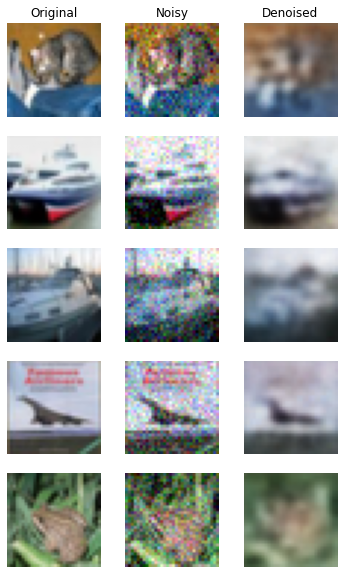

In [85]:
n_images = 5
new_images = X_test[:n_images]
new_images_noisy = new_images + np.random.randn(n_images, 32, 32, 3) * 0.1
new_images_denoised = denoise_autoencoder.predict(new_images_noisy)

plt.figure(figsize=(6, n_images * 2))
for index in range(n_images):
    plt.subplot(n_images, 3, index * 3 + 1)
    plt.imshow(new_images[index])
    plt.axis('off')
    if index == 0:
        plt.title("Original")
    plt.subplot(n_images, 3, index * 3 + 2)
    plt.imshow(np.clip(new_images_noisy[index], 0., 1.))
    plt.axis('off')
    if index == 0:
        plt.title("Noisy")
    plt.subplot(n_images, 3, index * 3 + 3)
    plt.imshow(new_images_denoised[index])
    plt.axis('off')
    if index == 0:
        plt.title("Denoised")
plt.show()

###  Build a classification DNN, reusing the lower layers of the autoencoder. Train it using only 500 images from the training set. Does it perform better with or without pretraining?''

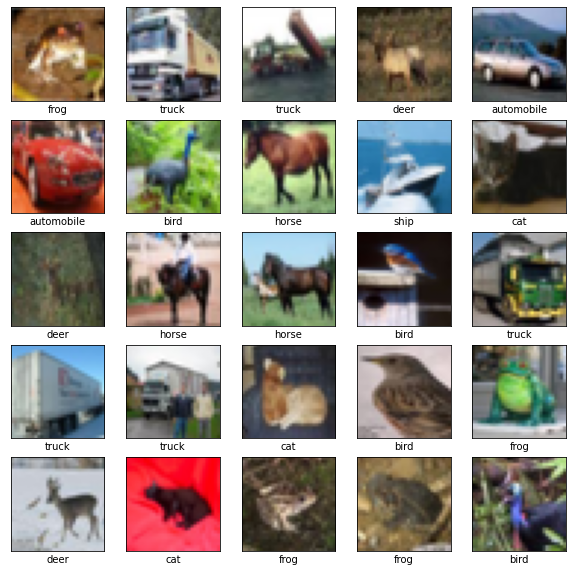

In [86]:
(train_images, train_labels), (test_images, test_labels) = keras.datasets.cifar10.load_data()

train_images, test_images = train_images / 255.0, test_images / 255.0

class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer',
               'dog', 'frog', 'horse', 'ship', 'truck']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i])
    # The CIFAR labels happen to be arrays, 
    # which is why you need the extra index
    plt.xlabel(class_names[train_labels[i][0]])
plt.show()

In [87]:
#one-hot encode our labels for layer
train_y_one_hot = tf.keras.utils.to_categorical(train_labels)
test_y_one_hot = tf.keras.utils.to_categorical(test_labels)

# Displaying original labels and then change with one-hot encoding
print('Original label:', train_labels[0])
print('After conversion to one-hot:', train_y_one_hot[0])

Original label: [6]
After conversion to one-hot: [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]


In [88]:
from sklearn.model_selection import train_test_split
train_X,test_X,train_label,test_label = train_test_split(train_images ,train_y_one_hot,test_size=0.2)

In [89]:
def encoder(input_img):
    conv1 = keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img) 
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = keras.layers.BatchNormalization()(conv1)
    pool1 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(pool1) 
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = keras.layers.BatchNormalization()(conv2)
    pool2 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool2) 
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv4 = keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3) 
    conv4 = keras.layers.BatchNormalization()(conv4)
    conv4 = keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = keras.layers.BatchNormalization()(conv4)
    return conv4

In [90]:
def decoder(conv4):    
    conv5 = keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv4) 
    conv5 = keras.layers.BatchNormalization()(conv5)
    conv5 = keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = keras.layers.BatchNormalization()(conv5)
    conv6 = keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)
    conv6 = keras.layers.BatchNormalization()(conv6)
    conv6 = keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = keras.layers.BatchNormalization()(conv6)
    up1 = keras.layers.UpSampling2D()(conv6)
    conv7 = keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(up1) 
    conv7 = keras.layers.BatchNormalization()(conv7)
    conv7 = keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = keras.layers.BatchNormalization()(conv7)
    up2 = keras.layers.UpSampling2D()(conv7) 
    decoded = keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(up2)
    return decoded

In [91]:
input_img= keras.layers.Input(shape = [32, 32, 3])
autoencoder = keras.models.Model(input_img, decoder(encoder(input_img)))
autoencoder.compile(loss='mean_squared_error', optimizer = tf.keras.optimizers.RMSprop())

In [92]:
autoencoder.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_2 (Batc  (None, 32, 32, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_3 (Batc  (None, 32, 32, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 16, 16, 32)       0   

In [93]:
autoencoder_train = autoencoder.fit(X_train, X_train, batch_size=32,epochs=15,validation_data=(X_test, X_test))

Epoch 1/15
1563/1563 [==============================] - 48s 29ms/step - loss: 0.0139 - val_loss: 0.0116
Epoch 2/15
1563/1563 [==============================] - 44s 28ms/step - loss: 0.0097 - val_loss: 0.0099
Epoch 3/15
1563/1563 [==============================] - 45s 29ms/step - loss: 0.0090 - val_loss: 0.0089
Epoch 4/15
1563/1563 [==============================] - 45s 29ms/step - loss: 0.0086 - val_loss: 0.0084
Epoch 5/15
1563/1563 [==============================] - 43s 28ms/step - loss: 0.0083 - val_loss: 0.0101
Epoch 6/15
1563/1563 [==============================] - 43s 27ms/step - loss: 0.0081 - val_loss: 0.0089
Epoch 7/15
1563/1563 [==============================] - 43s 28ms/step - loss: 0.0079 - val_loss: 0.0136
Epoch 8/15
1563/1563 [==============================] - 45s 29ms/step - loss: 0.0078 - val_loss: 0.0075
Epoch 9/15
1563/1563 [==============================] - 44s 28ms/step - loss: 0.0078 - val_loss: 0.0073
Epoch 10/15
1563/1563 [==============================] - 43s 28m

In [94]:
def encoder(input_img):
    conv1 = keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img) 
    conv1 = keras.layers.BatchNormalization()(conv1)
    conv1 = keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = keras.layers.BatchNormalization()(conv1)
    pool1 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(pool1) 
    conv2 = keras.layers.BatchNormalization()(conv2)
    conv2 = keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = keras.layers.BatchNormalization()(conv2)
    pool2 = keras.layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool2) 
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv3 = keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = keras.layers.BatchNormalization()(conv3)
    conv4 = keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3) 
    conv4 = keras.layers.BatchNormalization()(conv4)
    conv4 = keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = keras.layers.BatchNormalization()(conv4)
    return conv4

In [95]:
def fully_connected_layers(encoding):
    flat = keras.layers.Flatten()(encoding)
    den = keras.layers.Dense(128, activation='relu')(flat)
    out = keras.layers.Dense(10, activation="softmax")(den) # 10 classes
    return out

In [96]:
encode = encoder(input_img)
full_model = keras.models.Model(input_img, fully_connected_layers(encode))

In [97]:
for l1,l2 in zip(full_model.layers[:19],autoencoder.layers[0:19]):
    l1.set_weights(l2.get_weights())

In [98]:
autoencoder.get_weights()[0][1]

array([[[ 3.98451835e-02, -6.89794496e-02,  3.36348891e-01,
         -2.85766609e-02,  4.49742489e-02,  5.90335988e-02,
         -3.34249854e-01,  8.01171511e-02,  1.15592778e-01,
          1.73682436e-01, -1.96286757e-02,  3.51737469e-01,
          2.33341232e-01, -1.00783788e-01, -5.11955563e-03,
          5.83028086e-02,  1.08974904e-01, -1.23238742e-01,
          2.19707176e-01,  2.86894049e-02,  5.80202648e-03,
         -3.70849445e-02,  3.01699396e-02,  2.84693211e-01,
         -1.37518523e-02,  1.35249645e-01, -1.86130792e-01,
          2.63484865e-02,  7.40119368e-02,  1.42726928e-01,
         -8.59781280e-02,  2.04617172e-01],
        [ 1.79598957e-01, -1.27342954e-01,  3.76596570e-01,
         -1.37180880e-01, -3.96173596e-02,  1.58245265e-01,
         -2.58819133e-01,  2.02761561e-01,  2.76055317e-02,
          1.50839195e-01, -3.42605785e-02,  3.17935914e-01,
          1.92186251e-01, -1.98910505e-01,  1.50794402e-01,
          2.44978350e-04,  8.18595067e-02, -5.91662750e-

In [99]:
# Turn layers off in encoder
for layer in full_model.layers[0:10]:
    layer.trainable = False

Now it is time for us to test our accuracy of our Deep Neural Network on the images:

In [100]:
full_model.compile(loss=keras.losses.categorical_crossentropy, optimizer=keras.optimizers.Adam(),metrics=['accuracy'])

In [101]:
full_model.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_21 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_16 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_22 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_17 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 16, 16, 32)       0   

In [102]:
# Using full dataset instead of 500 examples
classify_train = full_model.fit(train_X, train_label, batch_size=32,epochs=15,validation_data=(test_X, test_label))

Epoch 1/15
1250/1250 [==============================] - 10s 8ms/step - loss: 1.7622 - accuracy: 0.3830 - val_loss: 1.4129 - val_accuracy: 0.4915
Epoch 2/15
1250/1250 [==============================] - 9s 7ms/step - loss: 1.1773 - accuracy: 0.5734 - val_loss: 1.1842 - val_accuracy: 0.5837
Epoch 3/15
1250/1250 [==============================] - 9s 7ms/step - loss: 0.9703 - accuracy: 0.6513 - val_loss: 1.0927 - val_accuracy: 0.6164
Epoch 4/15
1250/1250 [==============================] - 9s 7ms/step - loss: 0.7786 - accuracy: 0.7232 - val_loss: 1.1049 - val_accuracy: 0.6321
Epoch 5/15
1250/1250 [==============================] - 9s 7ms/step - loss: 0.5797 - accuracy: 0.7936 - val_loss: 1.1510 - val_accuracy: 0.6447
Epoch 6/15
1250/1250 [==============================] - 9s 7ms/step - loss: 0.3957 - accuracy: 0.8596 - val_loss: 1.3349 - val_accuracy: 0.6532
Epoch 7/15
1250/1250 [==============================] - 9s 7ms/step - loss: 0.2794 - accuracy: 0.9018 - val_loss: 1.4731 - val_accuracy

In [103]:
# Evaluation
test_eval = full_model.evaluate(test_images, test_y_one_hot)

print('Test loss:', test_eval[0])
print('Test accuracy:', test_eval[1])

313/313 [==============================] - 1s 4ms/step - loss: 2.5213 - accuracy: 0.6361
Test loss: 2.5212695598602295
Test accuracy: 0.6360999941825867


Based on the results, the training data held up well, but the validation did not. Validation set may be too small so we can do a difference split next time for train test split...
Now to train with full model:

In [104]:
for layer in full_model.layers[0:19]:
    layer.trainable = True

In [105]:
full_model.compile(loss=keras.losses.categorical_crossentropy, optimizer=keras.optimizers.Adam(),metrics=['accuracy'])

In [106]:
classify_train = full_model.fit(train_X, train_label, batch_size=32,epochs=15,validation_data=(test_X, test_label))

Epoch 1/15
1250/1250 [==============================] - 13s 10ms/step - loss: 0.1616 - accuracy: 0.9461 - val_loss: 2.2514 - val_accuracy: 0.6363
Epoch 2/15
1250/1250 [==============================] - 12s 10ms/step - loss: 0.1175 - accuracy: 0.9602 - val_loss: 2.1004 - val_accuracy: 0.6516
Epoch 3/15
1250/1250 [==============================] - 12s 10ms/step - loss: 0.1073 - accuracy: 0.9640 - val_loss: 2.3478 - val_accuracy: 0.6265
Epoch 4/15
1250/1250 [==============================] - 12s 10ms/step - loss: 0.1090 - accuracy: 0.9638 - val_loss: 2.2293 - val_accuracy: 0.6357
Epoch 5/15
1250/1250 [==============================] - 12s 10ms/step - loss: 0.1010 - accuracy: 0.9675 - val_loss: 2.2383 - val_accuracy: 0.6437
Epoch 6/15
1250/1250 [==============================] - 12s 10ms/step - loss: 0.0930 - accuracy: 0.9689 - val_loss: 2.3702 - val_accuracy: 0.6470
Epoch 7/15
1250/1250 [==============================] - 12s 10ms/step - loss: 0.0902 - accuracy: 0.9703 - val_loss: 2.4029 -

In [107]:
# Evaluation
test_eval = full_model.evaluate(test_images, test_y_one_hot)

print('Test loss:', test_eval[0])
print('Test accuracy:', test_eval[1])

313/313 [==============================] - 1s 4ms/step - loss: 2.6590 - accuracy: 0.6481
Test loss: 2.658996343612671
Test accuracy: 0.6481000185012817


The fully connected layer with all layers included with training performs better in this case.

In [108]:
# Question #10
'''10. Train a variational autoencoder on the image dataset of your choice, and use it to
generate images. Alternatively, you can try to find an unlabeled dataset that you
are interested in and see if you can generate new samples.'''

'10. Train a variational autoencoder on the image dataset of your choice, and use it to\ngenerate images. Alternatively, you can try to find an unlabeled dataset that you\nare interested in and see if you can generate new samples.'

For this question, I am using the CelebFaces A dataset. Specifically this [kaggle](https://www.kaggle.com/jessicali9530/celeba-dataset) dataset. I downloaded the zip file and the appropriate .csv files. Let us now import them and begin:

In [3]:
celeb_df = pd.read_csv('list_attr_celeba.csv')
celeb_df.head()

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [4]:
from mpl_toolkits.axes_grid1 import ImageGrid
image_size = 64
batch_size = 128
data_dir = '../Chp 17/img_align_celeba_/'
data = os.listdir(data_dir)
AUTOTUNE = tf.data.AUTOTUNE


def parse_image(data):
    img = tf.io.read_file(data_dir + "/"+ data)
    img = tf.image.decode_jpeg(img, channels=3)
    
    shapes = tf.shape(img)
    h, w = shapes[-3], shapes[-2]
    small = tf.minimum(h, w)
    
    img = tf.image.convert_image_dtype(img, tf.float32) 
    img = tf.image.resize_with_crop_or_pad(img, small, small) 
    img = tf.image.resize(img, [image_size, image_size], antialias=True)
    return img

def plot_image(images): 
    plt.figure(figsize=(10, 10))
    plt.subplots_adjust(wspace=0.01,hspace=0.01)
    for i in range(36):
        ax = plt.subplot(6, 6, i + 1)
        plt.imshow(images[i])
        plt.axis("off")
        
def plot_reconstructed(original, reconstructed): 
    images = np.concatenate([original, reconstructed])
    fig = plt.figure(figsize=(10, 5))
    grid = ImageGrid(fig, 111, nrows_ncols=(2, 6), axes_pad=0, share_all=True)
    grid[0].get_yaxis().set_ticks([])
    grid[0].get_xaxis().set_ticks([])
    for ax, im in zip(grid, images):
        ax.imshow(im)
    plt.show()

In [5]:
list_ds = tf.data.Dataset.from_tensor_slices(data)
images_ds = list_ds.map(parse_image, num_parallel_calls=AUTOTUNE)
images_ds = images_ds.cache().shuffle(len(data)).batch(batch_size).prefetch(buffer_size=AUTOTUNE)

In [6]:
# retrieve a batch of images
image_batch = next(iter(images_ds))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


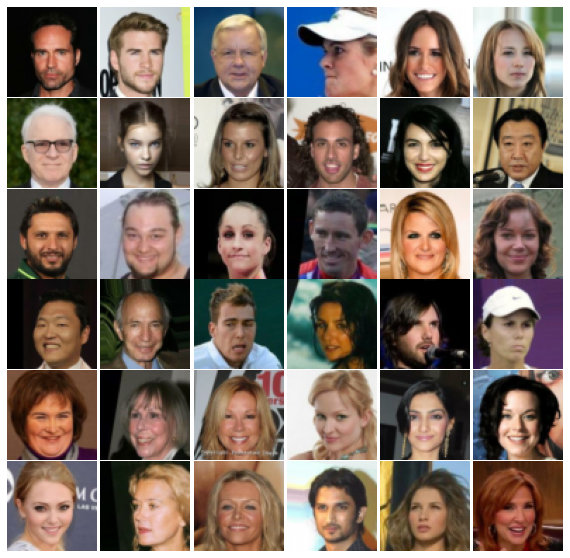

In [7]:
plot_image(image_batch.numpy())

In [8]:
class Sampling(tf.keras.layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [9]:
# Building the encoder
latent_dim = 128

encoder_inputs = keras.layers.Input(shape=(image_size, image_size, 3))

x = keras.layers.Conv2D(64, 3, strides=2, padding="same")(encoder_inputs)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Conv2D(128, 3, strides=2, padding="same")(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Conv2D(256, 3, strides=2, padding="same")(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Flatten()(x)

x = keras.layers.Dense(2048)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

z_mean = keras.layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = keras.layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])

encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="Encoder")
encoder.summary()

Model: "Encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 64)   1792        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 32, 32, 64)  256         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 32, 32, 64)   0           ['batch_normalization[0][0]

In [10]:
# Building the decoder
latent_inputs = keras.layers.Input(shape=(latent_dim,))

x = keras.layers.Dense(2048)(latent_inputs)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Dense(16384)(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Reshape((8,8,256))(x)

x = keras.layers.Conv2DTranspose(128, 3, strides=2, padding="same")(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Conv2DTranspose(64, 3, strides=2, padding="same")(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

x = keras.layers.Conv2DTranspose(32, 3, strides=2, padding="same")(x)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.LeakyReLU(0.2)(x)

decoder_outputs = keras.layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)

decoder = keras.Model(latent_inputs, decoder_outputs, name="Decoder")
decoder.summary()

Model: "Decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 dense_1 (Dense)             (None, 2048)              264192    
                                                                 
 batch_normalization_4 (Batc  (None, 2048)             8192      
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 16384)             33570816  
                                                                 
 batch_normalization_5 (Batc  (None, 16384)            65536     
 hNormalization)                                           

In [11]:
# Building the VAE
class VAE(keras.models.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(data)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction), axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss           
        
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

In [12]:
model_checkpoint_cb = keras.callbacks.ModelCheckpoint("VAE_modelcheck.h5", save_best_only=True)

In [13]:
#Train model
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam(1e-3))
vae.fit(images_ds, epochs=100, batch_size=batch_size, callbacks=model_checkpoint_cb)

Epoch 1/100
1583/1583 [==============================] - 303s 151ms/step - loss: 2279.7584 - reconstruction_loss: 2162.8503 - kl_loss: 42.9272
Epoch 2/100
1583/1583 [==============================] - 239s 151ms/step - loss: 2164.0399 - reconstruction_loss: 2112.6299 - kl_loss: 48.8810
Epoch 3/100
1583/1583 [==============================] - 239s 151ms/step - loss: 2157.5221 - reconstruction_loss: 2106.0244 - kl_loss: 50.2681
Epoch 4/100
1583/1583 [==============================] - 241s 152ms/step - loss: 2154.5296 - reconstruction_loss: 2101.4841 - kl_loss: 51.4228
Epoch 5/100
1583/1583 [==============================] - 238s 150ms/step - loss: 2151.0565 - reconstruction_loss: 2098.5347 - kl_loss: 52.0482
Epoch 6/100
1583/1583 [==============================] - 239s 151ms/step - loss: 2148.8978 - reconstruction_loss: 2096.2783 - kl_loss: 52.5650
Epoch 7/100
1583/1583 [==============================] - 239s 151ms/step - loss: 2148.1255 - reconstruction_loss: 2094.7617 - kl_loss: 52.9028

Epoch 25/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2139.5885 - reconstruction_loss: 2084.2825 - kl_loss: 54.7128
Epoch 26/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2139.8103 - reconstruction_loss: 2083.9783 - kl_loss: 54.7439
Epoch 27/100
1583/1583 [==============================] - 234s 148ms/step - loss: 2138.3253 - reconstruction_loss: 2083.7363 - kl_loss: 54.7770
Epoch 28/100
1583/1583 [==============================] - 232s 147ms/step - loss: 2137.3373 - reconstruction_loss: 2083.4438 - kl_loss: 54.7827
Epoch 29/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2138.8399 - reconstruction_loss: 2083.2151 - kl_loss: 54.8194
Epoch 30/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2137.9808 - reconstruction_loss: 2083.0244 - kl_loss: 54.8564
Epoch 31/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2138.2371 - reconstruction_loss: 2082.7551 - kl_loss: 

Epoch 49/100
1583/1583 [==============================] - 232s 147ms/step - loss: 2134.0752 - reconstruction_loss: 2079.4836 - kl_loss: 55.2595
Epoch 50/100
1583/1583 [==============================] - 234s 148ms/step - loss: 2133.2475 - reconstruction_loss: 2079.3557 - kl_loss: 55.2943
Epoch 51/100
1583/1583 [==============================] - 232s 147ms/step - loss: 2134.3458 - reconstruction_loss: 2079.1782 - kl_loss: 55.2696
Epoch 52/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2132.8920 - reconstruction_loss: 2079.0320 - kl_loss: 55.3247
Epoch 53/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2133.1711 - reconstruction_loss: 2078.8987 - kl_loss: 55.3239
Epoch 54/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2133.2975 - reconstruction_loss: 2078.7637 - kl_loss: 55.3328
Epoch 55/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2132.9044 - reconstruction_loss: 2078.6384 - kl_loss: 

Epoch 73/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2131.9081 - reconstruction_loss: 2076.4353 - kl_loss: 55.5792
Epoch 74/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2132.3711 - reconstruction_loss: 2076.3315 - kl_loss: 55.5764
Epoch 75/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2131.1449 - reconstruction_loss: 2076.2412 - kl_loss: 55.6054
Epoch 76/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2131.1953 - reconstruction_loss: 2076.0972 - kl_loss: 55.6151
Epoch 77/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2131.7158 - reconstruction_loss: 2076.0249 - kl_loss: 55.6257
Epoch 78/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2131.6379 - reconstruction_loss: 2075.9014 - kl_loss: 55.6196
Epoch 79/100
1583/1583 [==============================] - 232s 146ms/step - loss: 2132.0003 - reconstruction_loss: 2075.8135 - kl_loss: 

Epoch 97/100
1583/1583 [==============================] - 233s 147ms/step - loss: 2131.1056 - reconstruction_loss: 2074.1255 - kl_loss: 55.7796
Epoch 98/100
1583/1583 [==============================] - 230s 145ms/step - loss: 2129.8194 - reconstruction_loss: 2074.0271 - kl_loss: 55.7735
Epoch 99/100
1583/1583 [==============================] - 230s 146ms/step - loss: 2129.4512 - reconstruction_loss: 2073.9292 - kl_loss: 55.7719
Epoch 100/100
1583/1583 [==============================] - 231s 146ms/step - loss: 2129.1166 - reconstruction_loss: 2073.8557 - kl_loss: 55.7833


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


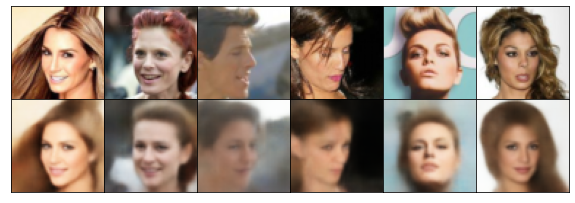

In [14]:
# Display reconstructed image
# load test data
test_ds = tf.data.Dataset.from_tensor_slices(data[:6])
test_ds = test_ds.map(parse_image, num_parallel_calls=AUTOTUNE)
test_ds = test_ds.batch(6).prefetch(buffer_size=AUTOTUNE)
test_batch = next(iter(test_ds))
# Reconstructed images
encoded_data  = vae.encoder.predict(test_ds)
decoded_data  = vae.decoder.predict(encoded_data[0])
plot_reconstructed(test_batch.numpy(),decoded_data)

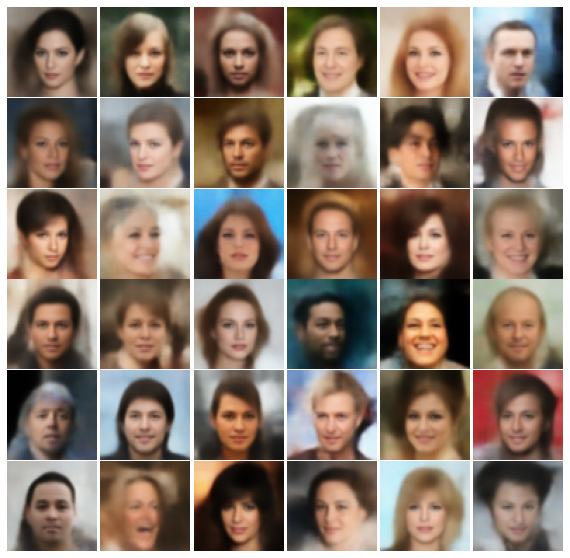

In [15]:
# Generating random faces
random_latent_vectors = tf.random.normal(shape=(36,latent_dim))
random_generated = vae.decoder.predict(random_latent_vectors)
plot_image(random_generated)

In [17]:
vae.save_weights('VAE_modelweight.h5')

In [ ]:
#Question #11
'''Train a DCGAN to tackle the image dataset of your choice, 
and use it to generate images. Add experience replay and see
if this helps. Turn it into a conditional GAN where you can 
control the generated class.'''

## This will be done as a seperate notebook & project displayed in GitHub. Notebook too big already to complete question in here.

# End of Notebook